# Surya 2D image forecast — flip experiment 
#### (JUST CODE NO MARKDOWN FILES)

Run top to bottom. 
Knobs are in cell 4 (`FLIP_PROBABILITY`, `N_SAMPLES`).



### every run needs these imports (10 cells):

In [11]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ.setdefault("CUBLAS_WORKSPACE_CONFIG", ":4096:8")   # must precede `import torch`
os.environ["WANDB_NOTEBOOK_NAME"] = "2b_flip_minimal.ipynb"

import sys
sys.path.append("../../")

import numpy as np
import pandas as pd
import torch
import lightning as L
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.loggers import CSVLogger, WandbLogger

from workshop_infrastructure.utils import build_scalers, apply_peft_lora, load_pretrained_weights
torch.set_float32_matmul_precision("medium")

In [12]:
from downstream_apps.flare_forecast.configs import load_flare_config

cfg = load_flare_config("./configs/config_script.yaml")
print(f"job={cfg.job_id}  batch_size={cfg.batch_size}  dtype={cfg.dtype}  "
      f"inputs={cfg.data.time_delta_input_minutes}  anchor={cfg.data.ds_time_column}")

job=solar_flare_forecasting  batch_size=2  dtype=float32  inputs=[-60, -36]  anchor=peak_time


In [13]:
from workshop_infrastructure.assets import ensure_assets

ensure_assets(cfg, which=["scalers", "weights"])
scalers = build_scalers(info=cfg.data.scalers_path)
print(f"scalers for {len(scalers)} channels")

scalers for 13 channels


In [14]:
# ============================== knobs ========================================
FLIP_PROBABILITY = 0.5        # training mix: 0.0 upright | 0.5 mixed | 1.0 flipped
N_TRAIN, N_VAL, N_TEST = 32, 16, 16       # 87 unique flares in total
VAL_YEARS  = (2014, 2015)     # cycle 24 maximum
TEST_YEARS = (2023,)          # cycle 25 -- the real polarity reversal, touched once
SUBSET_SEED    = 42           # change this to draw a DIFFERENT random training set
LOADER_WORKERS = 8            # host RAM while a loader runs ~ workers x PREFETCH x 2.6 GB
PREFETCH       = 2            # drop to 1 if `free -g` climbs toward 60
# =============================================================================
import copy
from functools import partial
from torch.utils.data import DataLoader
from downstream_apps.flare_forecast.datasets.flare_dataset import flare_Dataset
from workshop_infrastructure.datasets.builders import build_helio_datasets, _seed_worker

# 1. Build the FULL sets. Index matching only -- no NetCDF is read, so this is fast.
train_full, val_full = build_helio_datasets(
    cfg, flare_Dataset, scalers=scalers,
    return_surya_stack=True,
    max_number_of_samples=None,          # <-- uncapped: no [:N] earliest slice
    flip_probability=0.0,
    ds_flare_index_path=cfg.data.flare_index_path,
    ds_time_column=cfg.data.ds_time_column,
    ds_time_tolerance=cfg.data.ds_time_tolerance,
    ds_match_direction=cfg.data.ds_match_direction,
)
# val and test are different YEARS of the same split, so test starts as a shallow copy.
# take() rebinds attributes rather than mutating them, so the two stay independent.
test_full = copy.copy(val_full)


# 2. Pick a RANDOM subset, spread as evenly as possible across the available years.
def pick_stratified(ds, n, years=None, seed=0):
    times = pd.DatetimeIndex(ds.valid_indices)
    pool = np.arange(len(times))
    if years is not None:
        pool = pool[np.isin(times.year, list(years))]
    if len(pool) < n:
        raise ValueError(f"only {len(pool)} samples available for years={years}, need {n}")
    rng = np.random.default_rng(seed)
    buckets = {}
    for p in pool:
        buckets.setdefault(times[p].year, []).append(p)
    for y in buckets:
        rng.shuffle(buckets[y])                  # random within each year
    picked = []
    while len(picked) < n:                       # round-robin across years
        for y in sorted(buckets):
            if buckets[y] and len(picked) < n:
                picked.append(buckets[y].pop())
    return sorted(picked)


def take(ds, positions):
    """Shrink a dataset to `positions`. These three attributes ARE the sample list."""
    ds.valid_indices    = [ds.valid_indices[i] for i in positions]
    ds.df_valid_indices = ds.df_valid_indices.iloc[positions]
    ds.adjusted_length  = len(positions)
    return ds


train_ds = take(train_full, pick_stratified(train_full, N_TRAIN, seed=SUBSET_SEED))
val_ds   = take(val_full,   pick_stratified(val_full,  N_VAL,  years=VAL_YEARS,  seed=SUBSET_SEED))
test_ds  = take(test_full,  pick_stratified(test_full, N_TEST, years=TEST_YEARS, seed=SUBSET_SEED + 1))

train_ds.flip_probability = FLIP_PROBABILITY
val_ds.flip_probability = test_ds.flip_probability = 0.0   # evaluate() flips these by hand


# 3. Loaders. batch_size=1 so every result row is unambiguously flipped or not.
#
# worker_init_fn MUST live in a real importable module. Under "spawn" the child
# interpreter unpickles it BY REFERENCE as __main__.<name>, and a function defined in
# this notebook does not exist there -- every worker then dies instantly with exit
# code 1 and no traceback. builders.py keeps _seed_worker at module level for exactly
# this reason, so reuse it rather than defining one here.
def make_loader(ds, shuffle):
    kw = dict(batch_size=1, num_workers=LOADER_WORKERS, pin_memory=True, drop_last=False)
    if LOADER_WORKERS > 0:
        kw.update(
            multiprocessing_context="spawn",   # the boto3 handle does not survive fork
            persistent_workers=False,          # workers die at pass end, so RAM is released
            prefetch_factor=PREFETCH,
            worker_init_fn=partial(_seed_worker, base_seed=SUBSET_SEED),
        )
    g = torch.Generator(); g.manual_seed(SUBSET_SEED)
    return DataLoader(ds, shuffle=shuffle, generator=(g if shuffle else None), **kw)

train_data_loader = make_loader(train_ds, shuffle=True)
val_data_loader   = make_loader(val_ds,   shuffle=False)
test_data_loader  = make_loader(test_ds,  shuffle=False)

batch_size = 1            # cell 10 reads this
N_SAMPLES  = N_TRAIN      # the "extra checks" cells at the bottom still refer to this name

for _n, _d in (("train", train_ds), ("val", val_ds), ("test", test_ds)):
    _t = pd.DatetimeIndex(_d.valid_indices)
    _c = _d.df_valid_indices["GOES_class"].str[0].value_counts().to_dict()
    print(f"{_n:5s} {len(_d):3d} flares | years {dict(sorted(_t.year.value_counts().items()))} "
          f"| class {dict(sorted(_c.items()))} | flip_p {_d.flip_probability}")
print(f"\n{len(train_ds) + len(val_ds) + len(test_ds)} unique flares | batch_size {batch_size} | "
      f"{LOADER_WORKERS} workers | ~{LOADER_WORKERS * PREFETCH * 2.6:.0f} GB host RAM per active loader")

train  32 flares | years {2010: 3, 2011: 3, 2013: 3, 2014: 3, 2015: 3, 2016: 3, 2017: 3, 2018: 3, 2019: 3, 2020: 3, 2021: 2} | class {'C': 31, 'M': 1} | flip_p 0.5
val    16 flares | years {2014: 8, 2015: 8} | class {'C': 13, 'M': 3} | flip_p 0.0
test   16 flares | years {2023: 16} | class {'C': 14, 'M': 2} | flip_p 0.0

64 unique flares | batch_size 1 | 8 workers | ~42 GB host RAM per active loader


In [15]:
from workshop_infrastructure.models.finetune_models import HelioSpectformer2D

model = HelioSpectformer2D.from_config(
    cfg.model,
    ft_out_chans=len(cfg.data.channels),      # 13 -> output (B, 13, 4096, 4096)
    ft_unembedding_type="linear",
    dtype=cfg.dtype,
    use_latitude_in_learned_flow=cfg.use_latitude_in_learned_flow,
)
print("model built")

model built


In [16]:
load_pretrained_weights(model, cfg.model.pretrained_path)

# It only tries "k" and "backbone.k" (utils.py:404), so the decoder (checkpoint "unembed.*"
# -> model "head_unembed.*") is dropped silently: that is the 157/159. Without this the
# output layer stays at random init and MSE parks near 1.0.
_ckpt = torch.load(cfg.model.pretrained_path, weights_only=True, map_location="cpu")
_msd = model.state_dict()
_copied = []
for _k, _v in _ckpt.items():
    _t = f"head_{_k}"
    if _t in _msd:
        assert _v.shape == _msd[_t].shape, f"shape mismatch {_t}"
        _msd[_t] = _v
        _copied.append((_k, _t, tuple(_v.shape)))
assert _copied, f"no head_* match; unembed keys = {[k for k in _ckpt if k.startswith('unembed')]}"
model.load_state_dict(_msd, strict=True)
for _k, _t, _s in _copied:
    print(f"  + {_k} -> {_t}  {_s}")
print(f"decoder: {len(_copied)} tensors copied, all 159 now loaded")
del _ckpt, _msd

Loading pretrained weights from /home/jovyan/tmp/surya_workshop/downstream_apps/flare_forecast/assets/surya.366m.v1.pt.


Loaded 157 / 159 pretrained weights.


  + unembed.unembed.0.weight -> head_unembed.unembed.0.weight  (3328, 1280, 1, 1)
  + unembed.unembed.0.bias -> head_unembed.unembed.0.bias  (3328,)
decoder: 2 tensors copied, all 159 now loaded


In [17]:
# Three fine-tuning regimes, all selected from the model: section of the config:
#
#   use_lora: true                          -> LoRA adapters on attention + FFN (default)
#   use_lora: false, freeze_backbone: true  -> linear probe: only the head trains
#   use_lora: false, freeze_backbone: false -> full fine-tuning of all 366M parameters
#
# 3_finetune_template_1D.py applies exactly this logic in build_model().
if cfg.model.freeze_backbone:
    for name, param in model.named_parameters():
        if name.startswith("backbone."):
            param.requires_grad = False

if cfg.model.use_lora:
    model = apply_peft_lora(model, cfg.model.lora_config)

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
total = sum(p.numel() for p in model.parameters())
print(f"Trainable parameters: {trainable:,} / {total:,} ({100 * trainable / total:.2f}%)")

Applying PEFT LoRA: r=8, alpha=8, dropout=0.1, modules=['fc1', 'fc2', 'attn.qkv', 'attn.proj']
[LoRA] Adapted modules (36):
[LoRA]   backbone.backbone.blocks_attention.0.attn.proj
[LoRA]   backbone.backbone.blocks_attention.0.attn.qkv
[LoRA]   backbone.backbone.blocks_attention.0.mlp.fc1
[LoRA]   backbone.backbone.blocks_attention.0.mlp.fc2
[LoRA]   backbone.backbone.blocks_attention.1.attn.proj
[LoRA]   backbone.backbone.blocks_attention.1.attn.qkv
[LoRA]   backbone.backbone.blocks_attention.1.mlp.fc1
[LoRA]   backbone.backbone.blocks_attention.1.mlp.fc2
[LoRA]   backbone.backbone.blocks_attention.2.attn.proj
[LoRA]   backbone.backbone.blocks_attention.2.attn.qkv
[LoRA]   backbone.backbone.blocks_attention.2.mlp.fc1
[LoRA]   backbone.backbone.blocks_attention.2.mlp.fc2
[LoRA]   backbone.backbone.blocks_attention.3.attn.proj
[LoRA]   backbone.backbone.blocks_attention.3.attn.qkv
[LoRA]   backbone.backbone.blocks_attention.3.mlp.fc1
[LoRA]   backbone.backbone.blocks_attention.3.mlp.fc2


In [18]:
from downstream_apps.flare_forecast.metrics.flare_metrics import FlareMetrics

train_loss_metrics = FlareMetrics("train_loss")
# val_loss is the quantity logged as "val_loss" and used to pick the best checkpoint.
# It defaults to the same MSE as train_loss — override FlareMetrics.val_loss to change it.
val_loss_metrics = FlareMetrics("val_loss")
train_evaluation_metrics = FlareMetrics("train_metrics")
# Reported only: val_metrics do NOT influence checkpoint selection.
validation_evaluation_metrics = FlareMetrics("val_metrics")

In [19]:
from downstream_apps.flare_forecast.lightning_modules.pl_flare_baseline import FlareLightningModule

class Flare2DLightningModule(FlareLightningModule):
    """FlareLightningModule with a 2D image target instead of a scalar label."""

    @staticmethod
    def _target(batch):
        fc = batch["forecast"]
        assert fc.shape[2] == 1, (
            f"expected one target frame, got {fc.shape[2]}. Set training.rollout_steps: 0."
        )
        return fc[:, :, 0].float()          # (B, C, H, W)

    def _step(self, batch, stage):
        target = self._target(batch)
        if self.preprocess_fn is not None:
            batch = self.preprocess_fn(batch)
        output = self(batch)

        loss_fn = self.training_loss if stage == "train" else self.validation_loss
        eval_fn = self.training_evaluation if stage == "train" else self.validation_evaluation

        losses, weights = loss_fn(output, target)
        loss = self._combine_losses(losses, weights)
        self.log(f"{stage}_loss", loss, prog_bar=True, batch_size=self.batch_size, sync_dist=True)
        for k, v in losses.items():
            self.log(f"{stage}_loss_{k}", v, batch_size=self.batch_size, sync_dist=True)

        mets, mw = eval_fn(output, target)
        if len(mw) > 0:
            for k, v in mets.items():
                self.log(f"{stage}_metric_{k}", v, batch_size=self.batch_size, sync_dist=True)
        return loss

    def training_step(self, batch, batch_idx):   return self._step(batch, "train")
    def validation_step(self, batch, batch_idx): self._step(batch, "val")

In [20]:
L.seed_everything(42, workers=True)

metrics = {
    "train_loss":    train_loss_metrics,
    "val_loss":      val_loss_metrics,
    "train_metrics": train_evaluation_metrics,
    "val_metrics":   validation_evaluation_metrics,
}
lit_model = Flare2DLightningModule(model, metrics, lr=cfg.learning_rate, batch_size=batch_size)
print("lit_model ready. LoRA adapters start at zero contribution, so until you fit this IS "
      "the pretrained model -- the plot below is a valid untrained baseline.")

Seed set to 42


lit_model ready. LoRA adapters start at zero contribution, so until you fit this IS the pretrained model -- the plot below is a valid untrained baseline.


### small checks here: flip stats

In [12]:
# Flip check. A: the dataset's flip is correct. B: same sample scored both orientations.
dev = "cuda" if torch.cuda.is_available() else "cpu"
_KEYS = ("ts", "time_delta_input", "lead_time_delta")   # the only keys the backbone reads
mse = lambda a, b: torch.mean((a.float() - b.float()) ** 2).item()

# ---- A -----------------------------------------------------------------------
ds = train_data_loader.dataset
saved_p = ds.flip_probability
ds.flip_probability = 0.0; s_up = ds[0]
ds.flip_probability = 1.0; s_fl = ds[0]
assert not s_up["was_flipped"] and s_fl["was_flipped"], "was_flipped does not track flip_probability"
assert np.array_equal(s_fl["ts"], np.flip(s_up["ts"], axis=-2)), "input not flipped as expected"
assert np.array_equal(s_fl["forecast"], np.flip(s_up["forecast"], axis=-2)), \
    "TARGET not flipped with the input -- the model would be asked to predict a mirror image"
print("A. PASS  flip fires, is recorded in was_flipped, and flips BOTH input and target\n")
del s_up, s_fl

# ---- B -----------------------------------------------------------------------
model = model.to(dev).eval()
rows = []
for split, dl in (("train", train_data_loader), ("val", val_data_loader)):
    d = dl.dataset
    d.flip_probability = 0.0          # we flip by hand below so the pairing is exact
    for i in range(1): #len(d)):
        s = d[i]
        b = {k: torch.as_tensor(s[k])[None].to(dev) for k in _KEYS}
        tgt = torch.as_tensor(s["forecast"])[None][:, :, 0].to(dev)
        for orient in ("upright", "flipped"):
            bb, t = dict(b), tgt
            if orient == "flipped":
                bb["ts"] = torch.flip(b["ts"], dims=[-2])
                t = torch.flip(tgt, dims=[-2])
            with torch.no_grad(), torch.autocast(device_type=dev, dtype=torch.bfloat16):
                pred = model(bb).float()
            rows.append({"split": split, "i": i, "time": s["ds_index"][:16],
                         "orientation": orient, "error": mse(pred, t),
                         "persistence": mse(bb["ts"][:, :, -1], t)})
            print(f"\r  B: {split} {i+1}/{len(d)} {orient:8s}", end="", flush=True)
            del bb, t, pred
        del b, tgt
print()

#for d in (train_data_loader.dataset, val_data_loader.dataset):
#    d.flip_probability = saved_p      # hand the datasets back before anything else reads them

train_data_loader.dataset.flip_probability = saved_p   # val/test must stay at 0.0

model = model.to("cpu").train()
if dev == "cuda":
    torch.cuda.empty_cache()

tab = pd.DataFrame(rows)
print("\n" + tab.to_string(index=False))
print("\n" + tab.groupby(["split", "orientation"])[["error", "persistence"]].mean().to_string())

_p = tab.pivot_table(index=["split", "i"], columns="orientation", values="persistence")
_gap = (_p["upright"] - _p["flipped"]).abs().max()
assert _gap < 1e-4, f"persistence differs by {_gap:.2e} between orientations -- flip inconsistent"
_m = tab.pivot_table(index=["split", "i"], columns="orientation", values="error")
print(f"\npersistence gap {_gap:.1e} (must be ~0)   |   "
      f"flipped minus upright {(_m['flipped'] - _m['upright']).mean():+.4f}")
print(f"flip_probability restored to {saved_p}")

A. PASS  flip fires, is recorded in was_flipped, and flips BOTH input and target



  B: train 1/55 upright 

  B: train 1/55 flipped 

  B: val 1/16 upright 

  B: val 1/16 flipped 


split  i             time orientation    error  persistence
train  0 2010-06-13T09:46     upright 0.208911     0.403650
train  0 2010-06-13T09:46     flipped 0.223995     0.403650
  val  0 2014-01-17T09:23     upright 0.328346     0.607074
  val  0 2014-01-17T09:23     flipped 0.310175     0.607074

                      error  persistence
split orientation                       
train flipped      0.223995     0.403650
      upright      0.208911     0.403650
val   flipped      0.310175     0.607074
      upright      0.328346     0.607074

persistence gap 0.0e+00 (must be ~0)   |   flipped minus upright -0.0015
flip_probability restored to 0.0


### evaluate()

In [13]:
# ---------------------------------------------------------------------------
# Evaluation. paired=False (default): the dataset applies its own 50/50 coin flip
# and the sample is scored ONCE, as it came -- same regime as training.
# paired=True: score the same stack both ways. Not used for val.
# ---------------------------------------------------------------------------
import time

EVAL_KEYS = ("ts", "time_delta_input", "lead_time_delta")
MASK_CHAN = "aia131" if "aia131" in cfg.data.channels else cfg.data.channels[0]
MASK_FRAC = 0.001

def _mse(a, b):
    return torch.mean((a.float() - b.float()) ** 2).item()

@torch.no_grad()
def evaluate(lit, tag, loaders, paired=False):
    dev = "cuda" if torch.cuda.is_available() else "cpu"
    lit = lit.to(dev).eval()
    ci = list(cfg.data.channels).index(MASK_CHAN)
    rows, n_read, t0 = [], 0, time.perf_counter()

    for split, dl in loaders.items():
        d = dl.dataset
        # paired: we flip by hand, so the dataset must not.  unpaired: the dataset's
        # own coin decides, exactly as in training, and we record which way it landed.
        d.flip_probability = 0.0 if paired else 0.5
        for i, batch in enumerate(dl):
            meta = d.df_valid_indices.iloc[i]
            up  = {k: batch[k].to(dev) for k in EVAL_KEYS}
            tgt = batch["forecast"][:, :, 0].to(dev).float()
            n_read += 1

            flat = tgt[0, ci].reshape(-1)
            thr  = torch.topk(flat, max(1, int(MASK_FRAC * flat.numel()))).values[-1]
            mask = tgt[0, ci] >= thr

            if paired:
                variants = [("upright", False), ("flipped", True)]
            else:
                # already flipped (or not) by the dataset -- do NOT flip again
                variants = [("flipped" if bool(batch["was_flipped"][0]) else "upright", False)]

            for orient, do_flip in variants:
                b, t, m = up, tgt, mask
                if do_flip:
                    b = {**up, "ts": torch.flip(up["ts"], dims=[-2])}
                    t = torch.flip(tgt, dims=[-2])
                    m = torch.flip(mask, dims=[-2])
                with torch.autocast(device_type=dev, dtype=torch.bfloat16):
                    pred = lit(b).float()
                rows.append(dict(
                    run=tag, split=split, i=i, orientation=orient,
                    was_flipped=(orient == "flipped"),
                    time=str(d.valid_indices[i])[:16],
                    year=d.valid_indices[i].year,
                    GOES_class=meta["GOES_class"],
                    error=_mse(pred, t),
                    error_persistence=_mse(b["ts"][:, :, -1], t),
                    error_flare_region=_mse(pred[:, :, m], t[:, :, m]),
                ))
                del pred, b, t, m
            del up, tgt, mask, flat, batch
            if dev == "cuda":
                torch.cuda.empty_cache()
            el = time.perf_counter() - t0
            print(f"\r  [{tag}] {split} {i+1}/{len(d)}   {el/n_read:5.1f} s/sample   "
                  f"elapsed {el/60:4.1f} min", end="", flush=True)
    print()

    df = pd.DataFrame(rows)
    if paired:      # persistence never touches the model, so both halves must agree
        _p = df.pivot_table(index=["split", "i"], columns="orientation",
                            values="error_persistence")
        gap = (_p["upright"] - _p["flipped"]).abs().max()
        assert gap < 1e-4, f"persistence differs by {gap:.2e} across orientations"
        print(f"  persistence gap across orientations {gap:.1e}  (must be ~0)")
    print(f"  {n_read} samples read, {len(rows)} scores, "
          f"{int(df['was_flipped'].sum())} flipped / {int((~df['was_flipped']).sum())} upright")
    lit.to("cpu")
    if dev == "cuda":
        torch.cuda.empty_cache()
    return df

print(f"evaluate() ready. paired defaults to False. mask from {MASK_CHAN}, top {MASK_FRAC:.1%}.")

evaluate() ready. flare-region mask from aia131, top 0.1% of pixels.


### OG pull of pretrained weights 

In [14]:
# STAGE 1: the pretrained model with no fine-tuning. LoRA adapters start at zero
# contribution, so this really is stock Surya -- it is your control.
# Every sample here is a cold S3 read, so this is the slowest stage. It also warms
# the cache for the finetuned pass at the end.
df_baseline = evaluate(lit_model, "baseline", {"val": val_data_loader, "test": test_data_loader})
df_baseline.to_csv("results_baseline.csv", index=False)
print(df_baseline.groupby(["split", "orientation"])[
    ["error", "error_persistence", "error_flare_region"]].mean().to_string())

Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/home/jovyan/envs/surya_ws/lib/python3.12/multiprocessing/spawn.py", line 122, in spawn_main
    exitcode = _main(fd, parent_sentinel)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/jovyan/envs/surya_ws/lib/python3.12/multiprocessing/spawn.py", line 132, in _main
    self = reduction.pickle.load(from_parent)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: Can't get attribute '_init_worker' on <module '__main__' (<class '_frozen_importlib.BuiltinImporter'>)>


Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/home/jovyan/envs/surya_ws/lib/python3.12/multiprocessing/spawn.py", line 122, in spawn_main
    exitcode = _main(fd, parent_sentinel)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/jovyan/envs/surya_ws/lib/python3.12/multiprocessing/spawn.py", line 132, in _main
    self = reduction.pickle.load(from_parent)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/jovyan/tmp/surya_workshop/downstream_apps/flare_forecast/../../downstream_apps/flare_forecast/datasets/flare_dataset.py", line 4, in <module>
    from workshop_infrastructure.datasets.helio import HelioNetCDFDataset
  File "/home/jovyan/tmp/surya_workshop/downstream_apps/flare_forecast/../../workshop_infrastructure/datasets/helio.py", line 34, in <module>
    from workshop_infrastructure.utils import (
  File "/home/jovyan/tmp/surya_workshop/downstream_apps/flare_forecast/../../workshop_infrastructure/utils.py", line 12, in <module>


KeyboardInterrupt: 

### load wandb, prep trainer, etc.

In [ ]:
import time, datetime as dt

class StepProgress(L.Callback):
    """One durable line per step, to the notebook and to train_progress.log."""
    def __init__(self, logfile="train_progress.log"): self.logfile = logfile
    def _say(self, m):
        line = f"[{dt.datetime.now():%H:%M:%S}] {m}"
        print(line, flush=True)
        with open(self.logfile, "a") as fh: fh.write(line + "\n")
    def on_train_start(self, tr, pl):
        self.total = tr.max_epochs * len(tr.train_dataloader)
        self.t0, self.prev = time.perf_counter(), None
        self._say(f"START {self.total} steps -> {self.logfile}")
    def on_train_batch_start(self, tr, pl, batch, i):
        now = time.perf_counter()
        self.wait = 0.0 if self.prev is None else now - self.prev
        self.begin = now
    def on_train_batch_end(self, tr, pl, outputs, batch, i):
        self.prev = time.perf_counter()
        step, el = tr.global_step, self.prev - self.t0
        per = el / max(step, 1)
        loss = outputs["loss"] if isinstance(outputs, dict) else outputs
        self._say(f"step {step:3d}/{self.total}  loss {float(loss):.4f}  "
                  f"compute {self.prev-self.begin:5.1f}s  data-wait {self.wait:5.1f}s  "
                  f"{per:5.1f}s/step  ETA {(self.total-step)*per/60:4.1f}m")
    def on_train_end(self, tr, pl):
        self._say(f"END status={tr.state.status} step={tr.global_step}/{self.total}")

project_name = cfg.wandb_project
from datetime import datetime
run_name = f"flare_flip_finetune_{datetime.now():%m%d_%H%M}"

wandb_logger = WandbLogger(
    entity=cfg.wandb_entity,  # set wandb_entity in the config; null = personal account
    project=project_name,
    name=run_name,
    log_model=False,
    save_dir="./jpereira/wandb/wandb_tmp",
)

csv_logger = CSVLogger("runs", name=project_name)

#max_epochs = 2

# -------------------------------------------------------------------------
# Trainer
# -------------------------------------------------------------------------
MAX_EPOCHS = 1   # just 1 read.

trainer = L.Trainer(
    max_epochs=MAX_EPOCHS,
    max_time={"minutes": 45},        # hard wall-clock stop so a slow network can't eat the evening
    accelerator="auto",
    devices="auto",
    precision="bf16-mixed",
    logger=[wandb_logger, csv_logger],
    # No validation during fit -- the two evaluate() passes do all the scoring, and a
    # mid-training val pass would re-read samples for nothing.
    limit_val_batches=0,
    # No monitor: at ~110 steps there is no meaningful "best" epoch, so keep the final
    # weights. save_last still writes last.ckpt in case the kernel dies.
    callbacks=[ModelCheckpoint(save_top_k=0, save_last=True), StepProgress()],
    
    log_every_n_steps=1,
)
print(f"{MAX_EPOCHS} epochs x {len(train_data_loader)} steps = "
      f"{MAX_EPOCHS * len(train_data_loader)} optimizer steps")

### check 1 - results - 6 samples, short run

In [17]:
# Put the mix back before training, or every epoch sees one orientation only.
#train_data_loader.dataset.flip_probability = FLIP_PROBABILITY
#val_data_loader.dataset.flip_probability = FLIP_PROBABILITY

#trainer.fit(lit_model, train_data_loader, val_data_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/jovyan/envs/surya_ws/lib/python3.12/site-packages/lightning/pytorch/utilities/model_summary/model_summary.py:242: Precision bf16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.

  | Name  | Type      | Params | Mode  | FLOPs
----------------------------------------------------
0 | model | PeftModel | 371 M  | train | 0    
----------------------------------------------------
5.3 M     Trainable params
366 M     Non-trainable params
371 M     Total params
1,485.909 Total estimated model params size (MB)
377       Modules in train mode
0         Modules in eval mode
0         Total Flops


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/jovyan/envs/surya_ws/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


/home/jovyan/envs/surya_ws/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=2` reached.


In [ ]:
# Put the mix back before training, or every epoch sees one orientation only.
#train_data_loader.dataset.flip_probability = FLIP_PROBABILITY
#val_data_loader.dataset.flip_probability = FLIP_PROBABILITY

#trainer.fit(lit_model, train_data_loader, val_data_loader)

In [18]:
# Walk the training set with the real random flip left alone and keep the FIRST sample of
# each orientation that actually turns up. Nothing is forced and nothing is copied: these
# are two different flares that happened to land on opposite sides of the coin. If both
# turn up, the 50/50 mixing is working.
ds = train_data_loader.dataset
print(f"scanning {len(ds)} samples at flip_probability={ds.flip_probability}")

found = {}
pattern = []
for i in range(len(ds)):
    s = ds[i]
    was = bool(s["was_flipped"])
    pattern.append("F" if was else ".")
    if was not in found:
        found[was] = (i, s)
    else:
        del s
    print(f"\r  {i+1}/{len(ds)}  {''.join(pattern)}", end="", flush=True)
    if len(found) == 2:
        break
print(f"\n  F = flipped, . = upright  ->  {''.join(pattern)}")

assert len(found) == 2, (
    f"only got {'flipped' if True in found else 'upright'} samples in {len(pattern)} draws. "
    "Re-run this cell, or raise N_SAMPLES in cell 4, or check FLIP_PROBABILITY is 0.5."
)

# (tag, dataset index, sample) -- the index matters, the two samples are different flares.
SAMPLES = [("NOT FLIPPED", *found[False]), ("FLIPPED", *found[True])]
for tag, idx, item in SAMPLES:
    print(f"  {tag:12s} dataset index {idx}   event {item['ds_index']}")

scanning 6 samples at flip_probability=0.5


  1/6  F

  2/6  FF

  3/6  FF.


  F = flipped, . = upright  ->  FF.
  NOT FLIPPED  dataset index 2   event 2010-06-12T09:17:00
  FLIPPED      dataset index 0   event 2010-06-12T00:57:00



NOT FLIPPED


FLARE EVENT      : C6.1   
  start_time     : 2010-06-12T09:02:00
  peak_time      : 2010-06-12T09:17:00
  end_time       : 2010-06-12T09:22:00
 
 
ds_time_column = 'peak_time'  ->  2010-06-12 09:17:00
 
Ground Truth 2010-06-12 09:12:00
Reference Timestamp (helio.py anchor): 2010-06-12 09:12:00
    offset from peak_time  : 0 days 00:05:00  (5 min)
    ds_index vs reference gap: 0 days 00:05:00
 
 
config:  [-60, -36]   | n_input_timestamps = 2
 
source files:
  [input 0] 2010-06-12 08:12:00  (t=-24 min from now)
            -> s3://nasa-surya-bench/2010/06/20100612_0812.nc
  [input 1] 2010-06-12 08:36:00  (t=+0 min from now)
            -> s3://nasa-surya-bench/2010/06/20100612_0836.nc
  [GT    0] 2010-06-12 09:12:00  (+36 min from now)
            -> s3://nasa-surya-bench/2010/06/20100612_0912.nc
 
Flipped?  ->  flare_dataset = False | helio = False
 


NORMALIZED-SPACE MSE  (all 13 channels -- comparable to train_loss/val_loss)
  model              : 0.25045
  persistence        : 0.45515   <- copy 'now' forward, no model
  skill vs persist.  : +45.0%   (>0 = model helps)
 
PER-CHANNEL RMSE, physical units
  channel           model    persistence
  aia131           0.3317         0.3629
  aia171           0.1138         0.1447
 
 


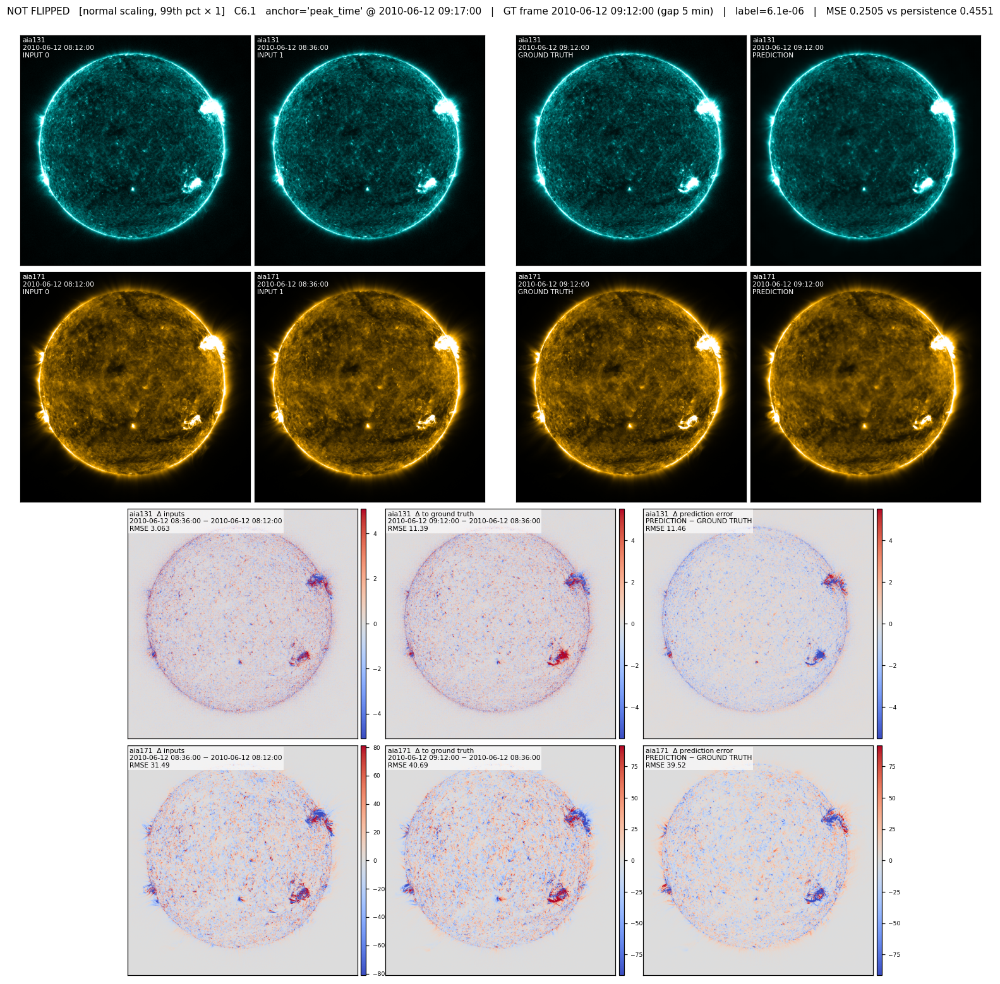

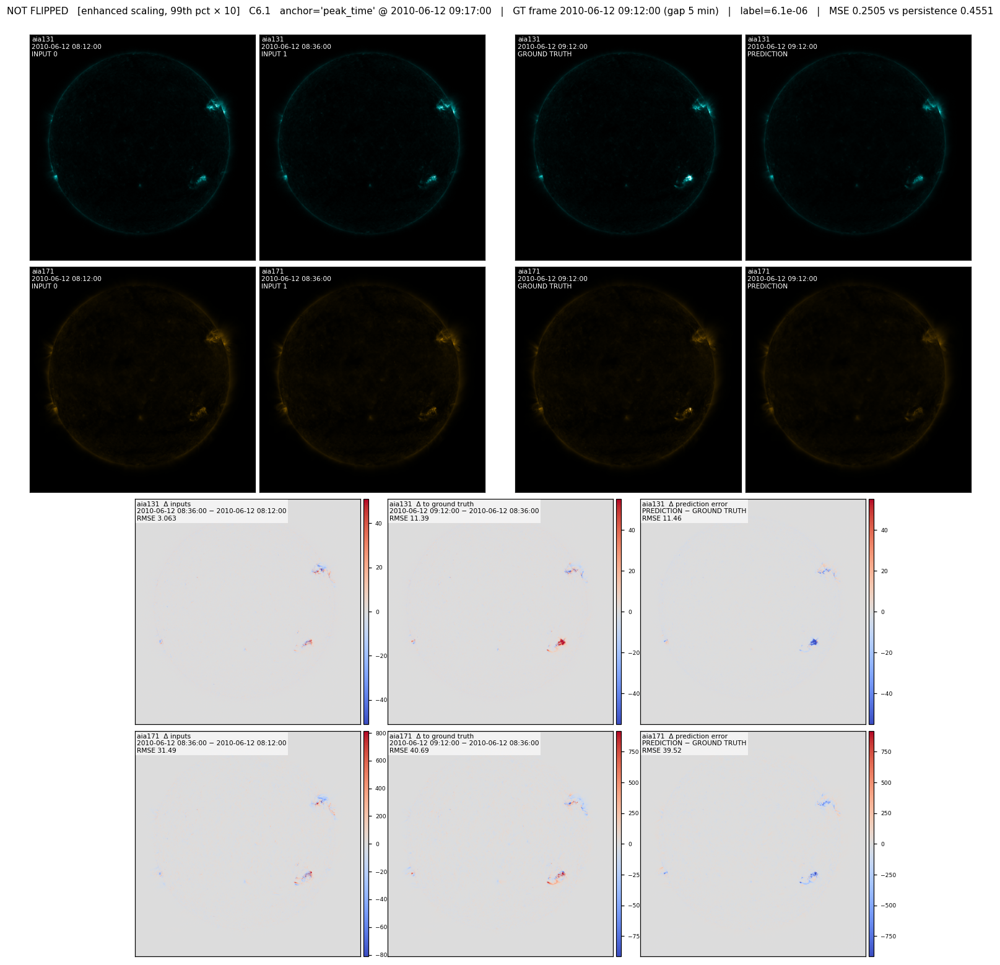


FLIPPED


FLARE EVENT      : M2.0   
  start_time     : 2010-06-12T00:30:00
  peak_time      : 2010-06-12T00:57:00
  end_time       : 2010-06-12T01:02:00
 
 
ds_time_column = 'peak_time'  ->  2010-06-12 00:57:00
 
Ground Truth 2010-06-12 00:48:00
Reference Timestamp (helio.py anchor): 2010-06-12 00:48:00
    offset from peak_time  : 0 days 00:09:00  (9 min)
    ds_index vs reference gap: 0 days 00:09:00
 
 
config:  [-60, -36]   | n_input_timestamps = 2
 
source files:
  [input 0] 2010-06-11 23:48:00  (t=-24 min from now)
            -> s3://nasa-surya-bench/2010/06/20100611_2348.nc
  [input 1] 2010-06-12 00:12:00  (t=+0 min from now)
            -> s3://nasa-surya-bench/2010/06/20100612_0012.nc
  [GT    0] 2010-06-12 00:48:00  (+36 min from now)
            -> s3://nasa-surya-bench/2010/06/20100612_0048.nc
 
Flipped?  ->  flare_dataset = True | helio = False
 


NORMALIZED-SPACE MSE  (all 13 channels -- comparable to train_loss/val_loss)
  model              : 0.23731
  persistence        : 0.43399   <- copy 'now' forward, no model
  skill vs persist.  : +45.3%   (>0 = model helps)
 
PER-CHANNEL RMSE, physical units
  channel           model    persistence
  aia131           0.2772         0.3236
  aia171           0.1129         0.1458
 
 


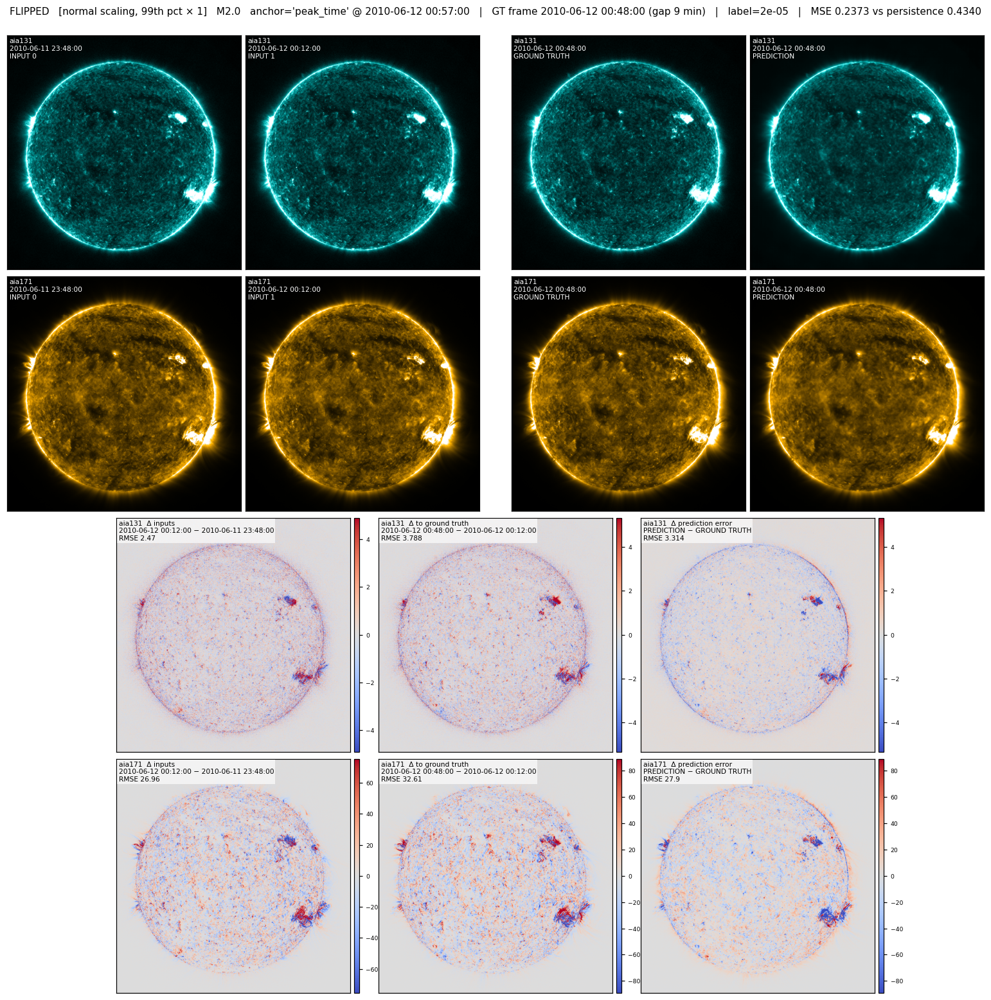

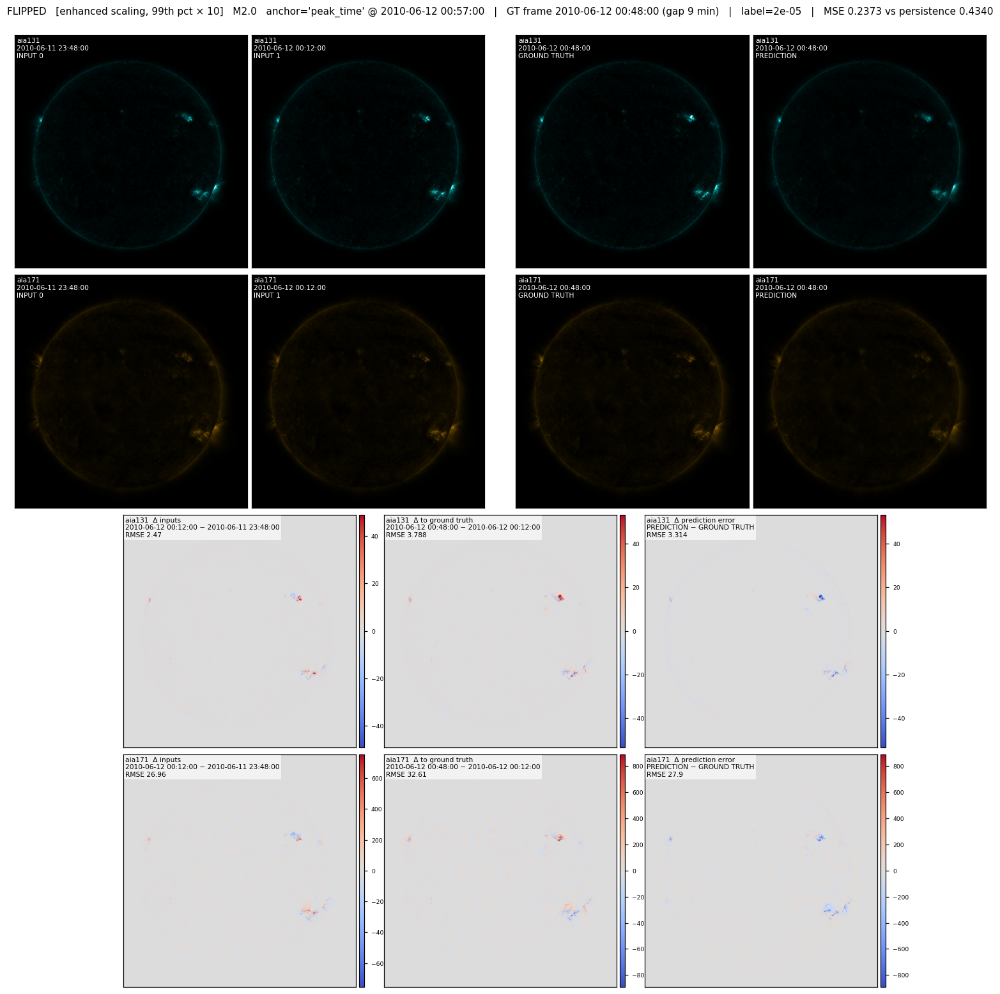

In [21]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import sunpy.visualization.colormaps as cm  # registers 'sdoaia131', 'hmimag', ...
from torch.utils.data._utils.collate import default_collate

# ==================================================================
# CONFIG FOR THIS CHECK
# ==================================================================
CHANNELS_TO_PLOT = ["aia131", "aia171"]          # one row per channel
SCALE_VERSIONS   = [("normal", 1), ("enhanced", 10)]   # 99th-pct multiplier
STRIDE           = 4     # 1 = full 4096. Set 4 to make the figure ~16x faster;
                         # inverse_transform is elementwise, so striding is exact.
SHARE_GT_PRED_SCALE = True   # see note under section 4

train_dataset = train_data_loader.dataset        # nb0's name for it

channel_order = cfg.data.channels
ch_idx = {c: channel_order.index(c) for c in CHANNELS_TO_PLOT}


# One figure set per orientation, from the two real samples the scan cell found.
# idx travels with each sample so the timestamps and GOES class below are its own.
for ORIENT, idx, item in SAMPLES:
    print("\n" + "=" * 100 + f"\n{ORIENT}\n" + "=" * 100)
    # The tag must be the sample's own recorded orientation -- nothing here forces it.
    assert bool(item["was_flipped"]) == (ORIENT == "FLIPPED"), "tag/was_flipped disagree"

    n_inputs = item["ts"].shape[1]
    n_lead   = item["forecast"].shape[1]
    assert n_lead == 1, f"this plot assumes one target frame; got {n_lead}. Set rollout_steps: 0."

    # ==================================================================
    # 0. RUN THE MODEL  (NEW)
    # ==================================================================
    # lit_model, not model: lit_model wraps the PEFT model with the trained adapters
    # and head. Lightning moves it back to CPU after fit, hence the explicit .to().
    lit_model = lit_model.to("cuda").eval()
    with torch.no_grad(), torch.autocast("cuda", dtype=torch.bfloat16):
        _b = default_collate([item])
        _b = {k: (v.to("cuda") if torch.is_tensor(v) else v) for k, v in _b.items()}
        pred_norm = lit_model(_b)[0].float().cpu().numpy()   # (13, H, W), normalized space
    del _b; torch.cuda.empty_cache()

    # ==================================================================
    # 1. TRUE FRAME TIMESTAMPS  (from the sample itself, not from ds_index)
    # ==================================================================
    reference_timestep = pd.Timestamp(train_dataset.valid_indices[idx])

    # helio.py: the LAST entry of the sorted input offsets is the "now" frame.
    now_offset_min = sorted(cfg.data.time_delta_input_minutes)[-1]
    now_time = reference_timestep + pd.Timedelta(minutes=now_offset_min)

    # time_delta_input = hours BEFORE now ; lead_time_delta = hours before now (neg = future)
    input_times  = [now_time - pd.Timedelta(minutes=round(float(h) * 60))
                    for h in item["time_delta_input"]]
    target_times = [now_time - pd.Timedelta(minutes=round(float(h) * 60))
                    for h in item["lead_time_delta"]]

    # ==================================================================
    # 2. PROVENANCE REPORT
    # ==================================================================
    row = train_dataset.df_valid_indices.iloc[idx]
    anchor_col   = cfg.data.ds_time_column
    anchor_event = pd.Timestamp(item["ds_index"])
    gt_time      = target_times[0]
    gap          = abs(gt_time - anchor_event)

    print(f"FLARE EVENT      : {row['GOES_class']}   ")
    print(f"  start_time     : {row['start_time']}")
    print(f"  peak_time      : {row['peak_time']}")
    print(f"  end_time       : {row['end_time']}")
    print(' ')
    print(' ')
    print(f"ds_time_column = '{anchor_col}'  ->  {anchor_event}")
    print(' ')
    print(f"Ground Truth {gt_time}")
    print(f"Reference Timestamp (helio.py anchor): {reference_timestep}")
    print(f"    offset from {anchor_col:<11}: {gap}  "
          f"({gap.total_seconds()/60:.0f} min)")
    print(f"    ds_index vs reference gap: {abs(reference_timestep - anchor_event)}")
    print(' ')
    print(' ')
    print("config: ", cfg.data.time_delta_input_minutes,
          f"  | n_input_timestamps = {train_dataset.n_input_timestamps}")
    print(' ')
    print("source files:")
    for k, ts in enumerate(input_times):
        print(f"  [input {k}] {ts}  (t{'' if k==0 else ''}={(ts-now_time).total_seconds()/60:+.0f} min from now)"
              f"\n            -> {train_dataset.index.loc[ts, 'path']}")
    for k, ts in enumerate(target_times):
        print(f"  [GT    {k}] {ts}  ({(ts-now_time).total_seconds()/60:+.0f} min from now)"
              f"\n            -> {train_dataset.index.loc[ts, 'path']}")
    print(' ')
    print(f"Flipped?  ->  flare_dataset = {item.get('was_flipped')} "
          f"| helio = {getattr(train_dataset, 'random_vert_flip', None)}")
    print(' ')

    # ==================================================================
    # 2b. PREDICTION QUALITY  (NEW)
    # ==================================================================
    # Per-channel means, then averaged: identical to the global mean (equal sizes) but
    # holds only one 67 MB channel at a time instead of four 872 MB arrays.
    _gt_n  = item["forecast"][:, 0]      # normalized space -- what the loss actually sees
    _now_n = item["ts"][:, -1]           # persistence: copy the "now" frame forward
    mse_model = float(np.mean([((pred_norm[k] - _gt_n[k]) ** 2).mean()
                               for k in range(len(channel_order))]))
    mse_persist = float(np.mean([((_now_n[k] - _gt_n[k]) ** 2).mean()
                                 for k in range(len(channel_order))]))
    print("NORMALIZED-SPACE MSE  (all 13 channels -- comparable to train_loss/val_loss)")
    print(f"  model              : {mse_model:.5f}")
    print(f"  persistence        : {mse_persist:.5f}   <- copy 'now' forward, no model")
    print(f"  skill vs persist.  : {1 - mse_model/mse_persist:+.1%}   (>0 = model helps)")
    print(' ')
    print("PER-CHANNEL RMSE, physical units")
    print(f"  {'channel':<10} {'model':>12} {'persistence':>14}")
    for c, n in ch_idx.items():
        rm = float(np.sqrt(((pred_norm[n] - _gt_n[n]) ** 2).mean()))
        rp = float(np.sqrt(((_now_n[n]    - _gt_n[n]) ** 2).mean()))
        print(f"  {c:<10} {rm:>12.4g} {rp:>14.4g}")
    print(' ')
    print(' ')

    # ==================================================================
    # 3. PHYSICAL-UNIT FRAMES PER CHANNEL
    # ==================================================================
    # Transform each FRAME once (all 13 channels at a time -- inverse_transform_data
    # indexes per-channel stats, so the channel axis must stay whole), then slice the
    # channels we plot out of the result.
    inv, _c, S = train_dataset.inverse_transform_data, np.ascontiguousarray, STRIDE
    ins_phys  = [inv(_c(item["ts"][:, t, ::S, ::S]))       for t in range(n_inputs)]
    tgts_phys = [inv(_c(item["forecast"][:, l, ::S, ::S])) for l in range(n_lead)]
    prds_phys = [inv(_c(pred_norm[:, ::S, ::S]))]

    frames = {c: ([a[n] for a in ins_phys],
                  [a[n] for a in tgts_phys],
                  [a[n] for a in prds_phys]) for c, n in ch_idx.items()}

    # ==================================================================
    # 4. PLOTTING
    # ==================================================================
    def _lim(a, factor):
        nz = a[a != 0]
        return (np.percentile(nz, 99) * factor) if nz.size else 1.0

    def _show(ax, img, channel, label, factor, lim=None):
        # lim=None keeps nb0's behaviour (each panel scaled to itself). Pass an explicit
        # lim to force two panels onto one scale -- required for GT vs PREDICTION, or a
        # prediction that is uniformly 10x too bright looks identical to the truth.
        if lim is None:
            lim = _lim(img, factor)
        if "hmi" not in channel:
            ax.imshow(img, cmap=f"sdo{channel}", vmin=0, vmax=lim)
            fc = "w"
        else:
            fc = "k"
            ax.imshow(img, cmap="coolwarm" if "_v" in channel else "hmimag",
                      vmin=-lim, vmax=lim)
        ax.text(0.01, 0.99, label, transform=ax.transAxes, ha="left", va="top",
                color=fc, fontsize=7)
        ax.set_xticks([]); ax.set_yticks([])

    n_out   = 2 * n_lead                                  # GT columns + PRED columns
    n_cols  = n_inputs + 1 + n_out                        # +1 = spacer column
    w_ratios = [1] * n_inputs + [0.10] + [1] * n_out

    for tag, factor in SCALE_VERSIONS:
        n_rows = len(CHANNELS_TO_PLOT) * 2                # image rows + diff rows
        panel = 3.4                                    # inches per (square) panel
        title_in = 0.42                                # inches reserved for suptitle
        fig_w = panel * (n_inputs + n_out) + panel * w_ratios[n_inputs]
        fig_h = panel * n_rows + title_in
        fig = plt.figure(figsize=(fig_w, fig_h), dpi=110)
        gs = gridspec.GridSpec(n_rows, n_cols, figure=fig,
                               width_ratios=w_ratios,
                               wspace=0.02, hspace=0.03,
                               left=0.004, right=0.996,
                               top=1 - title_in / fig_h,   # <- kills the title gap
                               bottom=0.004)
        # ---- image rows: one per channel, columns = time ----
        for r, c in enumerate(CHANNELS_TO_PLOT):
            ins, tgts, prds = frames[c]
            for t in range(n_inputs):
                _show(fig.add_subplot(gs[r, t]), ins[t], c,
                      f"{c}\n{input_times[t]}\nINPUT {t}", factor)
            for l in range(n_lead):
                gt_lim = _lim(tgts[l], factor)
                _show(fig.add_subplot(gs[r, n_inputs + 1 + l]), tgts[l], c,
                      f"{c}\n{target_times[l]}\nGROUND TRUTH", factor)
                _show(fig.add_subplot(gs[r, n_inputs + 1 + n_lead + l]), prds[l], c,
                      f"{c}\n{target_times[l]}\nPREDICTION", factor,
                      lim=gt_lim if SHARE_GT_PRED_SCALE else None)
        # ---- diff rows: centered below, layout of grid above untouched ----
        for r, c in enumerate(CHANNELS_TO_PLOT):
            ins, tgts, prds = frames[c]
            diffs = []
            if n_inputs >= 2:
                diffs.append((ins[-1] - ins[-2],
                              f"{c}  Δ inputs\n{input_times[-1]} − {input_times[-2]}", None))
            # The signal the model has to produce...
            d_signal = tgts[0] - ins[-1]
            lim_sig = np.percentile(np.abs(d_signal), 99) * factor or 1.0
            diffs.append((d_signal,
                          f"{c}  Δ to ground truth\n{target_times[0]} − {input_times[-1]}", lim_sig))
            # ...and how far off it is, on the SAME scale. Same amplitude as the panel to
            # its left => the model captured none of the change.
            diffs.append((prds[0] - tgts[0],
                          f"{c}  Δ prediction error\nPREDICTION − GROUND TRUTH", lim_sig))

            gap_u = w_ratios[n_inputs]
            n_d   = len(diffs)
            side  = (sum(w_ratios) - (n_d + gap_u * (n_d - 1))) / 2
            ratios = [side]
            for k in range(n_d):
                if k:
                    ratios.append(gap_u)
                ratios.append(1)
            ratios.append(side)
            inner = gs[len(CHANNELS_TO_PLOT) + r, :].subgridspec(
                1, len(ratios), width_ratios=ratios, wspace=0)
            for k, (d, title, forced) in enumerate(diffs):
                ax = fig.add_subplot(inner[0, 2 * k + 1])
                lim = forced if forced is not None else (np.percentile(np.abs(d), 99) * factor or 1.0)
                im = ax.imshow(d, cmap="coolwarm", vmin=-lim, vmax=lim)
                ax.text(0.01, 0.99, f"{title}\nRMSE {np.sqrt((d**2).mean()):.4g}",
                        transform=ax.transAxes, ha="left", va="top",
                        fontsize=7, color="k",
                        bbox=dict(fc="w", ec="none", alpha=0.65, pad=1.5))
                ax.set_xticks([]); ax.set_yticks([])
                cax = ax.inset_axes([1.015, 0.0, 0.022, 1.0])
                cb = fig.colorbar(im, cax=cax)
                cb.ax.tick_params(labelsize=6)
        fig.suptitle(
            f"{ORIENT}   [{tag} scaling, 99th pct × {factor}]   {row['GOES_class']}   "
            f"anchor='{anchor_col}' @ {anchor_event}   |   GT frame {gt_time} "
            f"(gap {gap.total_seconds()/60:.0f} min)   |   label={float(item['ground_truth']):.4g}"
            f"   |   MSE {mse_model:.4f} vs persistence {mse_persist:.4f}",
            fontsize=10, y=0.999)
        plt.show()

### Extra checks - here:

In [20]:
# How much data is actually available, ignoring the N_SAMPLES cap. This only does index
# matching -- no NetCDF is read -- so it is fast.
from workshop_infrastructure.datasets.builders import build_helio_datasets

_full = build_helio_datasets(
    cfg, flare_Dataset, scalers=scalers,
    return_surya_stack=True,
    max_number_of_samples=None,          # <- no cap
    flip_probability=0.0,
    ds_flare_index_path=cfg.data.flare_index_path,
    ds_time_column=cfg.data.ds_time_column,
    ds_time_tolerance=cfg.data.ds_time_tolerance,
    ds_match_direction=cfg.data.ds_match_direction,
)
for _name, _d in zip(("train", "val"), _full):
    _t = pd.DatetimeIndex(_d.valid_indices)
    print(f"{_name:5s}: {len(_d):5d} samples   {_t.min().date()} -> {_t.max().date()}")
    print(f"         by year: {dict(sorted(_t.year.value_counts().items()))}")

print(f"\nsteps per epoch at batch_size={cfg.batch_size}, drop_last=True:")
for _name, _d in zip(("train", "val"), _full):
    print(f"  {_name:5s}: {len(_d) // cfg.batch_size} steps for the full set  |  "
          f"{N_SAMPLES // cfg.batch_size} steps at your current N_SAMPLES={N_SAMPLES}")
del _full

train:  6279 samples   2010-06-12 -> 2021-12-31
         by year: {2010: 88, 2011: 1136, 2013: 1250, 2014: 1589, 2015: 1199, 2016: 186, 2017: 264, 2018: 7, 2019: 26, 2020: 86, 2021: 448}
val  :   321 samples   2011-01-21 -> 2023-01-30
         by year: {2011: 14, 2013: 11, 2014: 77, 2015: 77, 2016: 21, 2017: 7, 2019: 5, 2021: 2, 2023: 107}

steps per epoch at batch_size=2, drop_last=True:
  train: 3139 steps for the full set  |  3 steps at your current N_SAMPLES=6
  val  : 160 steps for the full set  |  3 steps at your current N_SAMPLES=6


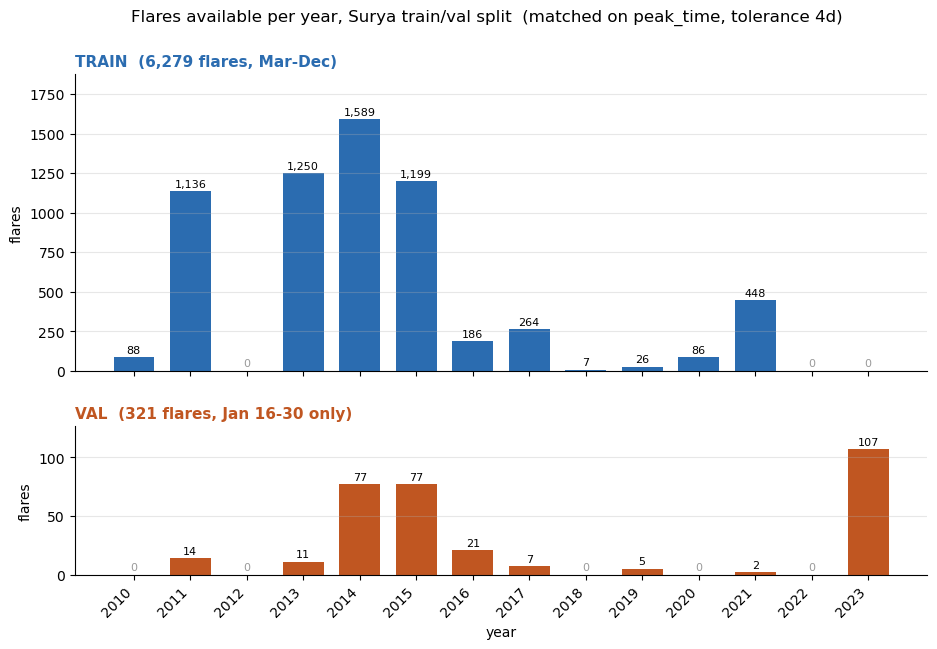

       2010  2011  2012  2013  2014  2015  2016  2017  2018  2019  2020  2021  2022  2023
train    88  1136     0  1250  1589  1199   186   264     7    26    86   448     0     0
val       0    14     0    11    77    77    21     7     0     5     0     2     0   107


In [22]:
# Flares per year in the train and val splits, uncapped by N_SAMPLES.
# Index matching only -- no NetCDF is read -- so this takes a few seconds.
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from workshop_infrastructure.datasets.builders import build_helio_datasets

_splits = build_helio_datasets(
    cfg, flare_Dataset, scalers=scalers,
    return_surya_stack=True, max_number_of_samples=None, flip_probability=0.0,
    ds_flare_index_path=cfg.data.flare_index_path,
    ds_time_column=cfg.data.ds_time_column,
    ds_time_tolerance=cfg.data.ds_time_tolerance,
    ds_match_direction=cfg.data.ds_match_direction,
)
counts = {name: pd.DatetimeIndex(d.valid_indices).year.value_counts()
          for name, d in zip(("train", "val"), _splits)}
del _splits

# Every year in the range, so the missing ones (2012, 2022) show up as visible gaps.
years = np.arange(min(c.index.min() for c in counts.values()),
                  max(c.index.max() for c in counts.values()) + 1)
train = counts["train"].reindex(years, fill_value=0)
val   = counts["val"].reindex(years, fill_value=0)

fig, axes = plt.subplots(2, 1, figsize=(11, 6.5), sharex=True,
                         gridspec_kw={"height_ratios": [2, 1], "hspace": 0.25})
for ax, series, label, color in (
    (axes[0], train, f"TRAIN  ({train.sum():,} flares, Mar-Dec)", "#2b6cb0"),
    (axes[1], val,   f"VAL  ({val.sum():,} flares, Jan 16-30 only)", "#c05621"),
):
    ax.bar(years, series.values, color=color, width=0.72)
    for x, v in zip(years, series.values):
        ax.annotate("0" if v == 0 else f"{v:,}", (x, v), textcoords="offset points",
                    xytext=(0, 3), ha="center", fontsize=8,
                    color="#999999" if v == 0 else "black")
    ax.set_ylabel("flares")
    ax.set_title(label, loc="left", fontsize=11, fontweight="bold", color=color)
    ax.set_ylim(0, series.max() * 1.18)
    ax.grid(axis="y", alpha=0.3)
    ax.spines[["top", "right"]].set_visible(False)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation=45, ha="right")
axes[1].set_xlabel("year")
fig.suptitle("Flares available per year, Surya train/val split  "
             f"(matched on {cfg.data.ds_time_column}, tolerance {cfg.data.ds_time_tolerance})",
             fontsize=12, y=0.98)
plt.show()

print(pd.DataFrame({"train": train, "val": val}).T.to_string())

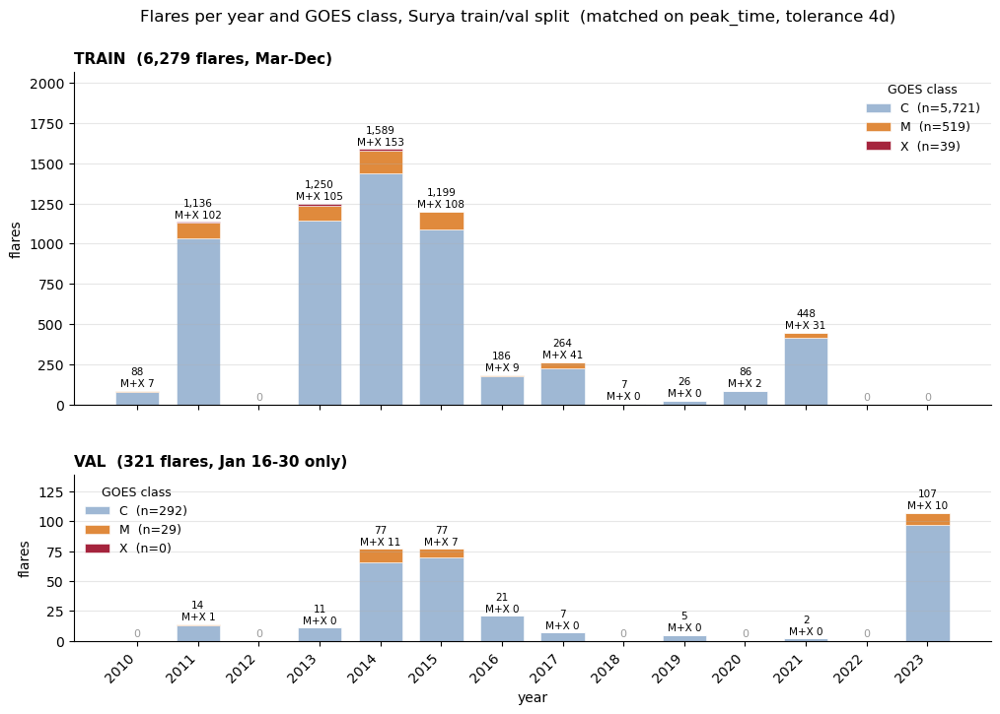


TRAIN
year  2010  2011  2012  2013  2014  2015  2016  2017  2018  2019  2020  2021  2022  2023  TOTAL
cls                                                                                            
C       81  1034     0  1145  1436  1091   177   223     7    26    84   417     0     0   5721
M        7    96     0    93   139   106     9    38     0     0     2    29     0     0    519
X        0     6     0    12    14     2     0     3     0     0     0     2     0     0     39

VAL
year  2010  2011  2012  2013  2014  2015  2016  2017  2018  2019  2020  2021  2022  2023  TOTAL
cls                                                                                            
C        0    13     0    11    66    70    21     7     0     5     0     2     0    97    292
M        0     1     0     0    11     7     0     0     0     0     0     0     0    10     29
X        0     0     0     0     0     0     0     0     0     0     0     0     0     0      0


In [23]:
# Flares per year and per GOES class (C / M / X) in the train and val splits,
# uncapped by N_SAMPLES. Index matching only -- no NetCDF is read.
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from workshop_infrastructure.datasets.builders import build_helio_datasets

_splits = build_helio_datasets(
    cfg, flare_Dataset, scalers=scalers,
    return_surya_stack=True, max_number_of_samples=None, flip_probability=0.0,
    ds_flare_index_path=cfg.data.flare_index_path,
    ds_time_column=cfg.data.ds_time_column,
    ds_time_tolerance=cfg.data.ds_time_tolerance,
    ds_match_direction=cfg.data.ds_match_direction,
)

CLASSES = ["C", "M", "X"]
COLOR   = {"C": "#9fb8d4", "M": "#e08a3c", "X": "#a5243d"}

tables = {}
for _name, _d in zip(("train", "val"), _splits):
    _df = _d.df_valid_indices.copy()
    _df["year"] = pd.DatetimeIndex(_d.valid_indices).year
    # CMX is the catalog's own class letter; cross-check it against GOES_class.
    _letter = _df["GOES_class"].astype(str).str[0]
    assert (_df["CMX"].astype(str).str.upper() == _letter).all(), "CMX disagrees with GOES_class"
    _df["cls"] = pd.Categorical(_letter, categories=CLASSES)
    assert _df["cls"].notna().all(), f"unexpected classes: {sorted(set(_letter) - set(CLASSES))}"
    tables[_name] = _df.pivot_table(index="year", columns="cls", aggfunc="size",
                                    observed=False, fill_value=0)[CLASSES]
del _splits

# Every year in the range, so missing ones (2012, 2022) show as visible gaps.
years = np.arange(min(t.index.min() for t in tables.values()),
                  max(t.index.max() for t in tables.values()) + 1)
tables = {k: v.reindex(years, fill_value=0) for k, v in tables.items()}

fig, axes = plt.subplots(2, 1, figsize=(12, 7.5), sharex=True,
                         gridspec_kw={"height_ratios": [2, 1], "hspace": 0.28})
for ax, name, window, legend_loc in ((axes[0], "train", "Mar-Dec", "upper right"),
                                     (axes[1], "val", "Jan 16-30 only", "upper left")):
    t = tables[name]
    bottom = np.zeros(len(years))
    for c in CLASSES:
        ax.bar(years, t[c].values, bottom=bottom, color=COLOR[c], width=0.72,
               label=f"{c}  (n={t[c].sum():,})", edgecolor="white", linewidth=0.4)
        bottom += t[c].values
    for x, tot, mx in zip(years, t.sum(1).values, (t["M"] + t["X"]).values):
        if tot == 0:
            ax.annotate("0", (x, 0), textcoords="offset points", xytext=(0, 3),
                        ha="center", fontsize=8, color="#999999")
        else:
            ax.annotate(f"{tot:,}\nM+X {mx}", (x, tot), textcoords="offset points",
                        xytext=(0, 3), ha="center", fontsize=7.5, linespacing=1.25)
    ax.set_ylabel("flares")
    ax.set_title(f"{name.upper()}  ({t.values.sum():,} flares, {window})",
                 loc="left", fontsize=11, fontweight="bold")
    ax.set_ylim(0, max(t.sum(1).max() * 1.30, 1))
    ax.grid(axis="y", alpha=0.3)
    ax.spines[["top", "right"]].set_visible(False)
    ax.legend(frameon=False, fontsize=9, loc=legend_loc, title="GOES class",
              title_fontsize=9)

axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation=45, ha="right")
axes[1].set_xlabel("year")
fig.suptitle("Flares per year and GOES class, Surya train/val split  "
             f"(matched on {cfg.data.ds_time_column}, tolerance {cfg.data.ds_time_tolerance})",
             fontsize=12, y=0.965)
plt.show()

for name, t in tables.items():
    out = t.T
    out["TOTAL"] = out.sum(1)
    print(f"\n{name.upper()}")
    print(out.to_string())

### new check - less than 1 hr run, 50 flares 

In [ ]:
# Training mix goes on now. Only the TRAINING set flips randomly; val and test stay at
# 0.0 because evaluate() flips them by hand to score each sample in both orientations.
train_data_loader.dataset.flip_probability = FLIP_PROBABILITY
val_data_loader.dataset.flip_probability = 0.0
test_data_loader.dataset.flip_probability = 0.0

trainer.fit(lit_model, train_data_loader)      # no val loader -> no validation passes

### run this after trainer.fit

In [ ]:
expected = trainer.max_epochs * len(train_data_loader)
status = str(trainer.state.status)
print("status         :", status)
print("epochs done    :", trainer.current_epoch, "of", trainer.max_epochs)
print("optimizer steps:", trainer.global_step, "of", expected)
if "INTERRUPTED" in status.upper():
    print("  ^^ interrupted by you / kernel restart -- max_time did NOT fire")
elif trainer.global_step < expected:
    print("  ^^ stopped early -- the max_time guard fired")
else:
    print("  ^^ completed all steps")
print("checkpoint     :", trainer.checkpoint_callback.last_model_path or "(none written)")

In [ ]:
trainer.save_checkpoint("finetuned_32steps.ckpt")   # NOT interrupted_33steps.ckpt
import wandb
if wandb.run is not None: wandb.run.finish()

#### checkpoint once its done running

In [ ]:
trainer.save_checkpoint("finetuned_32steps.ckpt")
import wandb
if wandb.run is not None: wandb.run.finish()

### pretrained surya weights - check

#### finding a flare to compare to from solar cycles

In [24]:
d = val_data_loader.dataset
df = d.df_valid_indices
print(df["GOES_class"].unique())
print(pd.DatetimeIndex(df["peak_time"]).year.value_counts())
print(df.groupby([pd.DatetimeIndex(df["peak_time"]).year, "GOES_class"]).size())

['C6.0' 'C8.9' 'C7.1' 'C1.3' 'C6.1' 'C8.3' 'C2.0' 'C2.3' 'C5.4' 'C4.3'
 'C1.0' 'C2.7' 'M2.1' 'C6.4' 'M1.7' 'M2.4']
peak_time
2014    8
2015    8
Name: count, dtype: int64
peak_time  GOES_class
2014       C1.3          1
           C2.0          1
           C2.3          1
           C6.0          1
           C6.1          1
           C7.1          1
           C8.3          1
           C8.9          1
2015       C1.0          1
           C2.7          1
           C4.3          1
           C5.4          1
           C6.4          1
           M1.7          1
           M2.1          1
           M2.4          1
dtype: int64


In [26]:
df_full = val_full.df_valid_indices
print("shape:", df_full.shape)
print("dtype of GOES_class:", df_full["GOES_class"].dtype)
print("unique classes:", df_full["GOES_class"].unique()[:20])
print("dtype of peak_time:", df_full["peak_time"].dtype)
print(pd.DatetimeIndex(df_full["peak_time"]).year.value_counts().sort_index())

shape: (16, 11)
dtype of GOES_class: object
unique classes: ['C6.0' 'C8.9' 'C7.1' 'C1.3' 'C6.1' 'C8.3' 'C2.0' 'C2.3' 'C5.4' 'C4.3'
 'C1.0' 'C2.7' 'M2.1' 'C6.4' 'M1.7' 'M2.4']
dtype of peak_time: object
peak_time
2014    8
2015    8
Name: count, dtype: int64


In [29]:
val_full_2017, _ = build_helio_datasets(
    cfg, flare_Dataset, scalers=scalers,
    return_surya_stack=True,
    max_number_of_samples=None,
    flip_probability=0.0,
    ds_flare_index_path=cfg.data.flare_index_path,
    ds_time_column=cfg.data.ds_time_column,
    ds_time_tolerance=cfg.data.ds_time_tolerance,
    ds_match_direction=cfg.data.ds_match_direction,
)

df_2017 = val_full_2017.df_valid_indices
mask = (pd.DatetimeIndex(df_2017["peak_time"]).year == 2017) & df_2017["GOES_class"].str.startswith(("M","X"))
print(df_2017.loc[mask, ["GOES_class", "peak_time"]].to_string(index=False))

GOES_class           peak_time
      M4.4 2017-04-01T21:48:00
      M5.3 2017-04-02T08:02:00
      M2.3 2017-04-02T13:00:00
      M2.1 2017-04-02T18:38:00
      M5.7 2017-04-02T20:33:00
      M1.2 2017-04-03T01:05:00
      M5.8 2017-04-03T14:29:00
      M1.3 2017-07-03T16:15:00
      M1.3 2017-07-09T03:18:00
      M2.4 2017-07-14T02:09:00
      M1.1 2017-08-20T01:52:00
      M1.2 2017-09-04T05:49:00
      M1.5 2017-09-04T15:30:00
      M1.0 2017-09-04T18:22:00
      M1.7 2017-09-04T19:37:00
      M1.5 2017-09-04T20:02:00
      M5.5 2017-09-04T20:33:00
      M2.1 2017-09-04T22:14:00
      M4.2 2017-09-05T01:08:00
      M1.0 2017-09-05T03:51:00
      M3.2 2017-09-05T04:53:00
      M2.3 2017-09-05T17:43:00
      X9.3 2017-09-06T12:02:00
      M2.5 2017-09-06T15:56:00
      M1.2 2017-09-06T23:39:00
      M2.4 2017-09-07T05:02:00
      M1.4 2017-09-07T09:54:00
      M7.3 2017-09-07T10:15:00
      X1.3 2017-09-07T14:36:00
      M3.9 2017-09-07T23:59:00
      M1.3 2017-09-08T02:24:00
      M1

In [30]:
mask_x = (pd.DatetimeIndex(df_2017["peak_time"]).year == 2017) & df_2014["GOES_class"].str.startswith("X")
print(df_2017.loc[mask_x, ["GOES_class", "peak_time"]].to_string(index=False))

GOES_class           peak_time
      X9.3 2017-09-06T12:02:00
      X1.3 2017-09-07T14:36:00
      X8.2 2017-09-10T16:06:00


In [34]:
df_all = val_full_2017.df_valid_indices
mask_2017 = df_all["peak_time"].astype(str).str.startswith("2017-09-10") & (df_all["GOES_class"] == "X8.2")
match = df_all.loc[mask_2017]
print(match[["GOES_class", "peak_time"]])

pos = df_all.index.get_loc(match.index[0])
print("position:", pos)

                    GOES_class            peak_time
valid_indices                                      
2017-09-10 16:00:00       X8.2  2017-09-10T16:06:00
position: 5549


In [35]:
import copy
event_ds = copy.copy(val_full_2017)
take(event_ds, [pos])   # shrinks event_ds to just this one flare
print(len(event_ds), event_ds.df_valid_indices[["GOES_class", "peak_time"]])

1                     GOES_class            peak_time
valid_indices                                      
2017-09-10 16:00:00       X8.2  2017-09-10T16:06:00


In [36]:
# ===== STAGE 4b: provenance + GT/PREDICTION panels, driven from val/test ======
# Identical layout to your training-set check: image rows are
#   INPUT 0 | INPUT 1 | (spacer) | GROUND TRUTH | PREDICTION
# and the diff rows below are  Δ inputs | Δ to ground truth | Δ prediction error,
# rendered at both scalings. What changed is only where the samples come from:
# val/test with the fine-tuned model, instead of SAMPLES from the training set.

import numpy as np, pandas as pd, torch
import matplotlib.pyplot as plt, matplotlib.gridspec as gridspec
import sunpy.visualization.colormaps as cm  # registers 'sdoaia131', 'hmimag', ...
from torch.utils.data._utils.collate import default_collate

# ==================================================================
# CONFIG FOR THIS CHECK
# ==================================================================
CHANNELS_TO_PLOT = ["aia131", "aia171"]                # one row per channel
SCALE_VERSIONS   = [("normal", 1), ("enhanced", 10)]   # 99th-pct multiplier
STRIDE           = 4     # 1 = full 4096, but that is ~872 MB per inverse-transformed
                         # frame x 4 frames per sample. Use 4 for a multi-sample sweep
                         # and drop to 1 for the one or two figures you actually show.
SHARE_GT_PRED_SCALE = True
#N_SHOW           = 2       # samples per split
SHOW_FLIPPED     = True   # True = render each sample a second time, hand-flipped
N_SHOW           = 1       # <-- was 2. You just need one sample to see the effect, not four.
SCALE_VERSIONS   = [("normal", 1)]   # <-- was two versions. Drop "enhanced" unless you want it too.

channel_order = cfg.data.channels
ch_idx = {c: channel_order.index(c) for c in CHANNELS_TO_PLOT}


def _lim(a, factor):
    nz = a[a != 0]
    return (np.percentile(nz, 99) * factor) if nz.size else 1.0


def _show(ax, img, channel, label, factor, lim=None):
    # lim=None scales each panel to itself. Pass an explicit lim to force two panels
    # onto one scale -- required for GT vs PREDICTION, or a prediction that is
    # uniformly 10x too bright looks identical to the truth.
    if lim is None:
        lim = _lim(img, factor)
    if "hmi" not in channel:
        ax.imshow(img, cmap=f"sdo{channel}", vmin=0, vmax=lim)
        fc = "w"
    else:
        fc = "k"
        ax.imshow(img, cmap="coolwarm" if "_v" in channel else "hmimag",
                  vmin=-lim, vmax=lim)
    ax.text(0.01, 0.99, label, transform=ax.transAxes, ha="left", va="top",
            color=fc, fontsize=7)
    ax.set_xticks([]); ax.set_yticks([])


def report_and_plot(ds, idx, split, lit, orient="UPRIGHT"):
    item = ds[idx]

    if orient == "FLIPPED":
        # Flip input AND target together -- the same contract the dataset's own flip
        # honours. Flipping only the input would ask the model for a mirror image.
        item = dict(item)
        item["ts"]       = np.ascontiguousarray(np.flip(item["ts"], axis=-2))
        item["forecast"] = np.ascontiguousarray(np.flip(item["forecast"], axis=-2))

    n_inputs = item["ts"].shape[1]
    n_lead   = item["forecast"].shape[1]
    assert n_lead == 1, f"this plot assumes one target frame; got {n_lead}. Set rollout_steps: 0."

    # ==================================================================
    # 0. RUN THE MODEL
    # ==================================================================
    # lit_model, not model: lit_model wraps the PEFT model with the trained adapters
    # and head. Lightning moves it back to CPU after fit, hence the explicit .to().
    lit = lit.to("cuda").eval()
    with torch.no_grad(), torch.autocast("cuda", dtype=torch.bfloat16):
        _b = default_collate([item])
        _b = {k: (v.to("cuda") if torch.is_tensor(v) else v) for k, v in _b.items()}
        pred_norm = lit(_b)[0].float().cpu().numpy()   # (13, H, W), normalized space
    del _b; torch.cuda.empty_cache()

    # ==================================================================
    # 1. TRUE FRAME TIMESTAMPS  (from the sample itself, not from ds_index)
    # ==================================================================
    reference_timestep = pd.Timestamp(ds.valid_indices[idx])

    # helio.py: the LAST entry of the sorted input offsets is the "now" frame.
    now_offset_min = sorted(cfg.data.time_delta_input_minutes)[-1]
    now_time = reference_timestep + pd.Timedelta(minutes=now_offset_min)

    input_times  = [now_time - pd.Timedelta(minutes=round(float(h) * 60))
                    for h in item["time_delta_input"]]
    target_times = [now_time - pd.Timedelta(minutes=round(float(h) * 60))
                    for h in item["lead_time_delta"]]

    # ==================================================================
    # 2. PROVENANCE REPORT
    # ==================================================================
    row = ds.df_valid_indices.iloc[idx]
    anchor_col   = cfg.data.ds_time_column
    anchor_event = pd.Timestamp(item["ds_index"])
    gt_time      = target_times[0]
    gap          = abs(gt_time - anchor_event)

    print("\n" + "=" * 100)
    print(f"{split.upper()}  sample {idx}  |  rendered {orient}")
    print("=" * 100)
    print(f"FLARE EVENT      : {row['GOES_class']}   ")
    print(f"  start_time     : {row['start_time']}")
    print(f"  peak_time      : {row['peak_time']}")
    print(f"  end_time       : {row['end_time']}")
    print(' ')
    print(f"ds_time_column = '{anchor_col}'  ->  {anchor_event}")
    print(' ')
    print(f"Ground Truth {gt_time}")
    print(f"Reference Timestamp (helio.py anchor): {reference_timestep}")
    print(f"    offset from {anchor_col:<11}: {gap}  ({gap.total_seconds()/60:.0f} min)")
    print(f"    ds_index vs reference gap: {abs(reference_timestep - anchor_event)}")
    print(' ')
    print("config: ", cfg.data.time_delta_input_minutes,
          f"  | n_input_timestamps = {ds.n_input_timestamps}")
    print(' ')
    print("source files:")
    for k, ts in enumerate(input_times):
        print(f"  [input {k}] {ts}  (t={(ts-now_time).total_seconds()/60:+.0f} min from now)"
              f"\n            -> {ds.index.loc[ts, 'path']}")
    for k, ts in enumerate(target_times):
        print(f"  [GT    {k}] {ts}  ({(ts-now_time).total_seconds()/60:+.0f} min from now)"
              f"\n            -> {ds.index.loc[ts, 'path']}")
    print(' ')
    # was_flipped is the DATASET's coin (0.0 here, so False). orient is what WE rendered.
    print(f"Flipped?  ->  rendered = {orient} | dataset coin = {item.get('was_flipped')} "
          f"| flip_probability = {ds.flip_probability}")
    print(' ')

    # ==================================================================
    # 2b. PREDICTION QUALITY
    # ==================================================================
    _gt_n  = item["forecast"][:, 0]      # normalized space -- what the loss actually sees
    _now_n = item["ts"][:, -1]           # persistence: copy the "now" frame forward
    mse_model = float(np.mean([((pred_norm[k] - _gt_n[k]) ** 2).mean()
                               for k in range(len(channel_order))]))
    mse_persist = float(np.mean([((_now_n[k] - _gt_n[k]) ** 2).mean()
                                 for k in range(len(channel_order))]))
    print("NORMALIZED-SPACE MSE  (all 13 channels -- comparable to train_loss/val_loss)")
    print(f"  model              : {mse_model:.5f}")
    print(f"  persistence        : {mse_persist:.5f}   <- copy 'now' forward, no model")
    print(f"  skill vs persist.  : {1 - mse_model/mse_persist:+.1%}   (>0 = model helps)")
    print(' ')
    print("PER-CHANNEL RMSE, physical units")
    print(f"  {'channel':<10} {'model':>12} {'persistence':>14}")
    for c, n in ch_idx.items():
        rm = float(np.sqrt(((pred_norm[n] - _gt_n[n]) ** 2).mean()))
        rp = float(np.sqrt(((_now_n[n]    - _gt_n[n]) ** 2).mean()))
        print(f"  {c:<10} {rm:>12.4g} {rp:>14.4g}")
    print(' ')

    # ==================================================================
    # 3. PHYSICAL-UNIT FRAMES PER CHANNEL
    # ==================================================================
    inv, _c, S = ds.inverse_transform_data, np.ascontiguousarray, STRIDE
    ins_phys  = [inv(_c(item["ts"][:, t, ::S, ::S]))       for t in range(n_inputs)]
    tgts_phys = [inv(_c(item["forecast"][:, l, ::S, ::S])) for l in range(n_lead)]
    prds_phys = [inv(_c(pred_norm[:, ::S, ::S]))]

    frames = {c: ([a[n] for a in ins_phys],
                  [a[n] for a in tgts_phys],
                  [a[n] for a in prds_phys]) for c, n in ch_idx.items()}

    # ==================================================================
    # 4. PLOTTING
    # ==================================================================
    n_out    = 2 * n_lead                        # GT columns + PRED columns
    n_cols   = n_inputs + 1 + n_out              # +1 = spacer column
    w_ratios = [1] * n_inputs + [0.10] + [1] * n_out

    for tag, factor in SCALE_VERSIONS:
        n_rows   = len(CHANNELS_TO_PLOT) * 2     # image rows + diff rows
        panel    = 3.4                           # inches per (square) panel
        title_in = 0.42                          # inches reserved for suptitle
        fig_w = panel * (n_inputs + n_out) + panel * w_ratios[n_inputs]
        fig_h = panel * n_rows + title_in
        fig = plt.figure(figsize=(fig_w, fig_h), dpi=110)
        gs = gridspec.GridSpec(n_rows, n_cols, figure=fig,
                               width_ratios=w_ratios,
                               wspace=0.02, hspace=0.03,
                               left=0.004, right=0.996,
                               top=1 - title_in / fig_h,
                               bottom=0.004)
        # ---- image rows: one per channel, columns = time ----
        for r, c in enumerate(CHANNELS_TO_PLOT):
            ins, tgts, prds = frames[c]
            for t in range(n_inputs):
                _show(fig.add_subplot(gs[r, t]), ins[t], c,
                      f"{c}\n{input_times[t]}\nINPUT {t}", factor)
            for l in range(n_lead):
                gt_lim = _lim(tgts[l], factor)
                _show(fig.add_subplot(gs[r, n_inputs + 1 + l]), tgts[l], c,
                      f"{c}\n{target_times[l]}\nGROUND TRUTH", factor)
                _show(fig.add_subplot(gs[r, n_inputs + 1 + n_lead + l]), prds[l], c,
                      f"{c}\n{target_times[l]}\nPREDICTION", factor,
                      lim=gt_lim if SHARE_GT_PRED_SCALE else None)
        # ---- diff rows: centered below, layout of grid above untouched ----
        for r, c in enumerate(CHANNELS_TO_PLOT):
            ins, tgts, prds = frames[c]
            diffs = []
            if n_inputs >= 2:
                diffs.append((ins[-1] - ins[-2],
                              f"{c}  Δ inputs\n{input_times[-1]} − {input_times[-2]}", None))
            # The signal the model has to produce...
            d_signal = tgts[0] - ins[-1]
            lim_sig = np.percentile(np.abs(d_signal), 99) * factor or 1.0
            diffs.append((d_signal,
                          f"{c}  Δ to ground truth\n{target_times[0]} − {input_times[-1]}", lim_sig))
            # ...and how far off it is, on the SAME scale. Same amplitude as the panel
            # to its left => the model captured none of the change.
            diffs.append((prds[0] - tgts[0],
                          f"{c}  Δ prediction error\nPREDICTION − GROUND TRUTH", lim_sig))

            gap_u  = w_ratios[n_inputs]
            n_d    = len(diffs)
            side   = (sum(w_ratios) - (n_d + gap_u * (n_d - 1))) / 2
            ratios = [side]
            for k in range(n_d):
                if k:
                    ratios.append(gap_u)
                ratios.append(1)
            ratios.append(side)
            inner = gs[len(CHANNELS_TO_PLOT) + r, :].subgridspec(
                1, len(ratios), width_ratios=ratios, wspace=0)
            for k, (d, title, forced) in enumerate(diffs):
                ax = fig.add_subplot(inner[0, 2 * k + 1])
                lim = forced if forced is not None else (np.percentile(np.abs(d), 99) * factor or 1.0)
                im = ax.imshow(d, cmap="coolwarm", vmin=-lim, vmax=lim)
                ax.text(0.01, 0.99, f"{title}\nRMSE {np.sqrt((d**2).mean()):.4g}",
                        transform=ax.transAxes, ha="left", va="top",
                        fontsize=7, color="k",
                        bbox=dict(fc="w", ec="none", alpha=0.65, pad=1.5))
                ax.set_xticks([]); ax.set_yticks([])
                cax = ax.inset_axes([1.015, 0.0, 0.022, 1.0])
                cb = fig.colorbar(im, cax=cax)
                cb.ax.tick_params(labelsize=6)
        fig.suptitle(
            f"{split.upper()} sample {idx}  {orient}   [{tag} scaling, 99th pct × {factor}]   "
            f"{row['GOES_class']}   anchor='{anchor_col}' @ {anchor_event}   |   "
            f"GT frame {gt_time} (gap {gap.total_seconds()/60:.0f} min)   |   "
            f"label={float(item['ground_truth']):.4g}   |   "
            f"MSE {mse_model:.4f} vs persistence {mse_persist:.4f}",
            fontsize=10, y=0.999)
        plt.show()
        plt.close(fig)      # a multi-sample sweep otherwise holds every figure in RAM

    del frames, ins_phys, tgts_phys, prds_phys, pred_norm, item
    return dict(split=split, i=idx, orientation=orient, GOES_class=row["GOES_class"],
                time=str(reference_timestep)[:16], mse_model=mse_model,
                mse_persistence=mse_persist, skill=1 - mse_model / mse_persist)


# ==================================================================
# DRIVER
# ==================================================================
summary = []
d = event_ds
d.flip_probability = 0.0
for idx in range(min(N_SHOW, len(d))):
    for o in (["UPRIGHT", "FLIPPED"] if SHOW_FLIPPED else ["UPRIGHT"]):
        summary.append(report_and_plot(d, idx, "2017-X8.2", lit_model, o))

print("\n" + pd.DataFrame(summary).to_string(index=False))

#### pulling preloaded and plotting.

In [31]:
bs = [p for n, p in lit_model.named_parameters() if "lora_B" in n]
mx = max(float(p.abs().max()) for p in bs)
print(f"max|B| = {mx:.3e}  ->", "STOCK PRETRAINED" if mx == 0 else "still fine-tuned!")

max|B| = 0.000e+00  -> STOCK PRETRAINED


/tmp/ipykernel_597/2912874779.py:2: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:836.)
  mx = max(float(p.abs().max()) for p in bs)


In [ ]:
# ===== STAGE 4b: provenance + GT/PREDICTION panels, driven from val/test ======
# Identical layout to your training-set check: image rows are
#   INPUT 0 | INPUT 1 | (spacer) | GROUND TRUTH | PREDICTION
# and the diff rows below are  Δ inputs | Δ to ground truth | Δ prediction error,
# rendered at both scalings. What changed is only where the samples come from:
# val/test with the fine-tuned model, instead of SAMPLES from the training set.

import numpy as np, pandas as pd, torch
import matplotlib.pyplot as plt, matplotlib.gridspec as gridspec
import sunpy.visualization.colormaps as cm  # registers 'sdoaia131', 'hmimag', ...
from torch.utils.data._utils.collate import default_collate

# ==================================================================
# CONFIG FOR THIS CHECK
# ==================================================================
CHANNELS_TO_PLOT = ["aia131", "aia171"]                # one row per channel
SCALE_VERSIONS   = [("normal", 1), ("enhanced", 10)]   # 99th-pct multiplier
STRIDE           = 4     # 1 = full 4096, but that is ~872 MB per inverse-transformed
                         # frame x 4 frames per sample. Use 4 for a multi-sample sweep
                         # and drop to 1 for the one or two figures you actually show.
SHARE_GT_PRED_SCALE = True
#N_SHOW           = 2       # samples per split
SHOW_FLIPPED     = True   # True = render each sample a second time, hand-flipped
N_SHOW           = 1       # <-- was 2. You just need one sample to see the effect, not four.
SCALE_VERSIONS   = [("normal", 1)]   # <-- was two versions. Drop "enhanced" unless you want it too.

channel_order = cfg.data.channels
ch_idx = {c: channel_order.index(c) for c in CHANNELS_TO_PLOT}


def _lim(a, factor):
    nz = a[a != 0]
    return (np.percentile(nz, 99) * factor) if nz.size else 1.0


def _show(ax, img, channel, label, factor, lim=None):
    # lim=None scales each panel to itself. Pass an explicit lim to force two panels
    # onto one scale -- required for GT vs PREDICTION, or a prediction that is
    # uniformly 10x too bright looks identical to the truth.
    if lim is None:
        lim = _lim(img, factor)
    if "hmi" not in channel:
        ax.imshow(img, cmap=f"sdo{channel}", vmin=0, vmax=lim)
        fc = "w"
    else:
        fc = "k"
        ax.imshow(img, cmap="coolwarm" if "_v" in channel else "hmimag",
                  vmin=-lim, vmax=lim)
    ax.text(0.01, 0.99, label, transform=ax.transAxes, ha="left", va="top",
            color=fc, fontsize=7)
    ax.set_xticks([]); ax.set_yticks([])


def report_and_plot(ds, idx, split, lit, orient="UPRIGHT"):
    item = ds[idx]

    if orient == "FLIPPED":
        # Flip input AND target together -- the same contract the dataset's own flip
        # honours. Flipping only the input would ask the model for a mirror image.
        item = dict(item)
        item["ts"]       = np.ascontiguousarray(np.flip(item["ts"], axis=-2))
        item["forecast"] = np.ascontiguousarray(np.flip(item["forecast"], axis=-2))

    n_inputs = item["ts"].shape[1]
    n_lead   = item["forecast"].shape[1]
    assert n_lead == 1, f"this plot assumes one target frame; got {n_lead}. Set rollout_steps: 0."

    # ==================================================================
    # 0. RUN THE MODEL
    # ==================================================================
    # lit_model, not model: lit_model wraps the PEFT model with the trained adapters
    # and head. Lightning moves it back to CPU after fit, hence the explicit .to().
    lit = lit.to("cuda").eval()
    with torch.no_grad(), torch.autocast("cuda", dtype=torch.bfloat16):
        _b = default_collate([item])
        _b = {k: (v.to("cuda") if torch.is_tensor(v) else v) for k, v in _b.items()}
        pred_norm = lit(_b)[0].float().cpu().numpy()   # (13, H, W), normalized space
    del _b; torch.cuda.empty_cache()

    # ==================================================================
    # 1. TRUE FRAME TIMESTAMPS  (from the sample itself, not from ds_index)
    # ==================================================================
    reference_timestep = pd.Timestamp(ds.valid_indices[idx])

    # helio.py: the LAST entry of the sorted input offsets is the "now" frame.
    now_offset_min = sorted(cfg.data.time_delta_input_minutes)[-1]
    now_time = reference_timestep + pd.Timedelta(minutes=now_offset_min)

    input_times  = [now_time - pd.Timedelta(minutes=round(float(h) * 60))
                    for h in item["time_delta_input"]]
    target_times = [now_time - pd.Timedelta(minutes=round(float(h) * 60))
                    for h in item["lead_time_delta"]]

    # ==================================================================
    # 2. PROVENANCE REPORT
    # ==================================================================
    row = ds.df_valid_indices.iloc[idx]
    anchor_col   = cfg.data.ds_time_column
    anchor_event = pd.Timestamp(item["ds_index"])
    gt_time      = target_times[0]
    gap          = abs(gt_time - anchor_event)

    print("\n" + "=" * 100)
    print(f"{split.upper()}  sample {idx}  |  rendered {orient}")
    print("=" * 100)
    print(f"FLARE EVENT      : {row['GOES_class']}   ")
    print(f"  start_time     : {row['start_time']}")
    print(f"  peak_time      : {row['peak_time']}")
    print(f"  end_time       : {row['end_time']}")
    print(' ')
    print(f"ds_time_column = '{anchor_col}'  ->  {anchor_event}")
    print(' ')
    print(f"Ground Truth {gt_time}")
    print(f"Reference Timestamp (helio.py anchor): {reference_timestep}")
    print(f"    offset from {anchor_col:<11}: {gap}  ({gap.total_seconds()/60:.0f} min)")
    print(f"    ds_index vs reference gap: {abs(reference_timestep - anchor_event)}")
    print(' ')
    print("config: ", cfg.data.time_delta_input_minutes,
          f"  | n_input_timestamps = {ds.n_input_timestamps}")
    print(' ')
    print("source files:")
    for k, ts in enumerate(input_times):
        print(f"  [input {k}] {ts}  (t={(ts-now_time).total_seconds()/60:+.0f} min from now)"
              f"\n            -> {ds.index.loc[ts, 'path']}")
    for k, ts in enumerate(target_times):
        print(f"  [GT    {k}] {ts}  ({(ts-now_time).total_seconds()/60:+.0f} min from now)"
              f"\n            -> {ds.index.loc[ts, 'path']}")
    print(' ')
    # was_flipped is the DATASET's coin (0.0 here, so False). orient is what WE rendered.
    print(f"Flipped?  ->  rendered = {orient} | dataset coin = {item.get('was_flipped')} "
          f"| flip_probability = {ds.flip_probability}")
    print(' ')

    # ==================================================================
    # 2b. PREDICTION QUALITY
    # ==================================================================
    _gt_n  = item["forecast"][:, 0]      # normalized space -- what the loss actually sees
    _now_n = item["ts"][:, -1]           # persistence: copy the "now" frame forward
    mse_model = float(np.mean([((pred_norm[k] - _gt_n[k]) ** 2).mean()
                               for k in range(len(channel_order))]))
    mse_persist = float(np.mean([((_now_n[k] - _gt_n[k]) ** 2).mean()
                                 for k in range(len(channel_order))]))
    print("NORMALIZED-SPACE MSE  (all 13 channels -- comparable to train_loss/val_loss)")
    print(f"  model              : {mse_model:.5f}")
    print(f"  persistence        : {mse_persist:.5f}   <- copy 'now' forward, no model")
    print(f"  skill vs persist.  : {1 - mse_model/mse_persist:+.1%}   (>0 = model helps)")
    print(' ')
    print("PER-CHANNEL RMSE, physical units")
    print(f"  {'channel':<10} {'model':>12} {'persistence':>14}")
    for c, n in ch_idx.items():
        rm = float(np.sqrt(((pred_norm[n] - _gt_n[n]) ** 2).mean()))
        rp = float(np.sqrt(((_now_n[n]    - _gt_n[n]) ** 2).mean()))
        print(f"  {c:<10} {rm:>12.4g} {rp:>14.4g}")
    print(' ')

    # ==================================================================
    # 3. PHYSICAL-UNIT FRAMES PER CHANNEL
    # ==================================================================
    inv, _c, S = ds.inverse_transform_data, np.ascontiguousarray, STRIDE
    ins_phys  = [inv(_c(item["ts"][:, t, ::S, ::S]))       for t in range(n_inputs)]
    tgts_phys = [inv(_c(item["forecast"][:, l, ::S, ::S])) for l in range(n_lead)]
    prds_phys = [inv(_c(pred_norm[:, ::S, ::S]))]

    frames = {c: ([a[n] for a in ins_phys],
                  [a[n] for a in tgts_phys],
                  [a[n] for a in prds_phys]) for c, n in ch_idx.items()}

    # ==================================================================
    # 4. PLOTTING
    # ==================================================================
    n_out    = 2 * n_lead                        # GT columns + PRED columns
    n_cols   = n_inputs + 1 + n_out              # +1 = spacer column
    w_ratios = [1] * n_inputs + [0.10] + [1] * n_out

    for tag, factor in SCALE_VERSIONS:
        n_rows   = len(CHANNELS_TO_PLOT) * 2     # image rows + diff rows
        panel    = 3.4                           # inches per (square) panel
        title_in = 0.42                          # inches reserved for suptitle
        fig_w = panel * (n_inputs + n_out) + panel * w_ratios[n_inputs]
        fig_h = panel * n_rows + title_in
        fig = plt.figure(figsize=(fig_w, fig_h), dpi=110)
        gs = gridspec.GridSpec(n_rows, n_cols, figure=fig,
                               width_ratios=w_ratios,
                               wspace=0.02, hspace=0.03,
                               left=0.004, right=0.996,
                               top=1 - title_in / fig_h,
                               bottom=0.004)
        # ---- image rows: one per channel, columns = time ----
        for r, c in enumerate(CHANNELS_TO_PLOT):
            ins, tgts, prds = frames[c]
            for t in range(n_inputs):
                _show(fig.add_subplot(gs[r, t]), ins[t], c,
                      f"{c}\n{input_times[t]}\nINPUT {t}", factor)
            for l in range(n_lead):
                gt_lim = _lim(tgts[l], factor)
                _show(fig.add_subplot(gs[r, n_inputs + 1 + l]), tgts[l], c,
                      f"{c}\n{target_times[l]}\nGROUND TRUTH", factor)
                _show(fig.add_subplot(gs[r, n_inputs + 1 + n_lead + l]), prds[l], c,
                      f"{c}\n{target_times[l]}\nPREDICTION", factor,
                      lim=gt_lim if SHARE_GT_PRED_SCALE else None)
        # ---- diff rows: centered below, layout of grid above untouched ----
        for r, c in enumerate(CHANNELS_TO_PLOT):
            ins, tgts, prds = frames[c]
            diffs = []
            if n_inputs >= 2:
                diffs.append((ins[-1] - ins[-2],
                              f"{c}  Δ inputs\n{input_times[-1]} − {input_times[-2]}", None))
            # The signal the model has to produce...
            d_signal = tgts[0] - ins[-1]
            lim_sig = np.percentile(np.abs(d_signal), 99) * factor or 1.0
            diffs.append((d_signal,
                          f"{c}  Δ to ground truth\n{target_times[0]} − {input_times[-1]}", lim_sig))
            # ...and how far off it is, on the SAME scale. Same amplitude as the panel
            # to its left => the model captured none of the change.
            diffs.append((prds[0] - tgts[0],
                          f"{c}  Δ prediction error\nPREDICTION − GROUND TRUTH", lim_sig))

            gap_u  = w_ratios[n_inputs]
            n_d    = len(diffs)
            side   = (sum(w_ratios) - (n_d + gap_u * (n_d - 1))) / 2
            ratios = [side]
            for k in range(n_d):
                if k:
                    ratios.append(gap_u)
                ratios.append(1)
            ratios.append(side)
            inner = gs[len(CHANNELS_TO_PLOT) + r, :].subgridspec(
                1, len(ratios), width_ratios=ratios, wspace=0)
            for k, (d, title, forced) in enumerate(diffs):
                ax = fig.add_subplot(inner[0, 2 * k + 1])
                lim = forced if forced is not None else (np.percentile(np.abs(d), 99) * factor or 1.0)
                im = ax.imshow(d, cmap="coolwarm", vmin=-lim, vmax=lim)
                ax.text(0.01, 0.99, f"{title}\nRMSE {np.sqrt((d**2).mean()):.4g}",
                        transform=ax.transAxes, ha="left", va="top",
                        fontsize=7, color="k",
                        bbox=dict(fc="w", ec="none", alpha=0.65, pad=1.5))
                ax.set_xticks([]); ax.set_yticks([])
                cax = ax.inset_axes([1.015, 0.0, 0.022, 1.0])
                cb = fig.colorbar(im, cax=cax)
                cb.ax.tick_params(labelsize=6)
        fig.suptitle(
            f"{split.upper()} sample {idx}  {orient}   [{tag} scaling, 99th pct × {factor}]   "
            f"{row['GOES_class']}   anchor='{anchor_col}' @ {anchor_event}   |   "
            f"GT frame {gt_time} (gap {gap.total_seconds()/60:.0f} min)   |   "
            f"label={float(item['ground_truth']):.4g}   |   "
            f"MSE {mse_model:.4f} vs persistence {mse_persist:.4f}",
            fontsize=10, y=0.999)
        plt.show()
        plt.close(fig)      # a multi-sample sweep otherwise holds every figure in RAM

    del frames, ins_phys, tgts_phys, prds_phys, pred_norm, item
    return dict(split=split, i=idx, orientation=orient, GOES_class=row["GOES_class"],
                time=str(reference_timestep)[:16], mse_model=mse_model,
                mse_persistence=mse_persist, skill=1 - mse_model / mse_persist)


# ==================================================================
# DRIVER
# ==================================================================
summary = []
for split, dl in (("test", test_data_loader),):
    d = dl.dataset
    d.flip_probability = 0.0          # orientation is rendered explicitly below
    for idx in range(min(N_SHOW, len(d))):
        for o in (["UPRIGHT", "FLIPPED"] if SHOW_FLIPPED else ["UPRIGHT"]):
            summary.append(report_and_plot(d, idx, split, lit_model, o))

print("\n" + pd.DataFrame(summary).to_string(index=False))

### if it crashes: reload weights

In [ ]:
ckpt = torch.load("finetuned_32steps.ckpt", map_location="cpu", weights_only=False)
lit_model.load_state_dict(ckpt["state_dict"])   # strict: architecture must match exactly
print("epoch:", ckpt.get("epoch"), " global_step:", ckpt.get("global_step"))   # expect 1, 32

In [ ]:
bs = [p for n, p in lit_model.named_parameters() if "lora_B" in n]
mx = max(float(p.abs().max()) for p in bs)
print(f"{len(bs)} lora_B tensors, max|B| = {mx:.3e}  ->",
      "TRAINED" if mx > 0 else "UNTRAINED (B still all zeros)")

In [ ]:
bs = [p for n, p in lit_model.named_parameters() if "lora_B" in n]
mx = max(float(p.abs().max()) for p in bs)
print(f"{len(bs)} lora_B tensors, max|B| = {mx:.3e}  ->",
      "TRAINED" if mx > 0 else "UNTRAINED (B still all zeros)")

### plots - trained weights

In [ ]:
# STAGE 4: the same 32 samples, same paired scoring, now with fine-tuned weights.
# All warm reads, so this runs about 3x faster than the baseline pass.
df_finetuned = evaluate(lit_model, "finetuned", {"val": val_data_loader, "test": test_data_loader})
df_finetuned.to_csv("results_finetuned.csv", index=False)

res = pd.concat([df_baseline, df_finetuned], ignore_index=True)
res.to_csv("results_all.csv", index=False)
cols = ["error", "error_persistence", "error_flare_region"]

print("\n=== 1. does orientation matter? (your hypothesis) ===")
print(res.groupby(["run", "orientation"])[cols].mean().to_string())

print("\n=== 2. cycle 24 (val, 2014-15) vs cycle 25 (test, 2023) -- the real thing ===")
print(res.groupby(["run", "split", "orientation"])[cols].mean().to_string())

print("\n=== 3. did fine-tuning help at all? ===")
print(res.groupby("run")[cols].mean().to_string())

# The headline number. Positive means flipping makes the model worse.
piv = res.pivot_table(index=["run", "split", "i"], columns="orientation", values="error")
print("\nflipped minus upright, per sample (positive = flipping hurts):")
print((piv["flipped"] - piv["upright"]).groupby(level=["run", "split"])
      .agg(["mean", "std", "count"]).to_string())

In [ ]:
# ===== STAGE 4b: provenance + GT/PREDICTION panels, driven from val/test ======
# Identical layout to your training-set check: image rows are
#   INPUT 0 | INPUT 1 | (spacer) | GROUND TRUTH | PREDICTION
# and the diff rows below are  Δ inputs | Δ to ground truth | Δ prediction error,
# rendered at both scalings. What changed is only where the samples come from:
# val/test with the fine-tuned model, instead of SAMPLES from the training set.

import numpy as np, pandas as pd, torch
import matplotlib.pyplot as plt, matplotlib.gridspec as gridspec
import sunpy.visualization.colormaps as cm  # registers 'sdoaia131', 'hmimag', ...
from torch.utils.data._utils.collate import default_collate

# ==================================================================
# CONFIG FOR THIS CHECK
# ==================================================================
CHANNELS_TO_PLOT = ["aia131", "aia171"]                # one row per channel
SCALE_VERSIONS   = [("normal", 1), ("enhanced", 10)]   # 99th-pct multiplier
STRIDE           = 4     # 1 = full 4096, but that is ~872 MB per inverse-transformed
                         # frame x 4 frames per sample. Use 4 for a multi-sample sweep
                         # and drop to 1 for the one or two figures you actually show.
SHARE_GT_PRED_SCALE = True
N_SHOW           = 2       # samples per split
SHOW_FLIPPED     = False   # True = render each sample a second time, hand-flipped

channel_order = cfg.data.channels
ch_idx = {c: channel_order.index(c) for c in CHANNELS_TO_PLOT}


def _lim(a, factor):
    nz = a[a != 0]
    return (np.percentile(nz, 99) * factor) if nz.size else 1.0


def _show(ax, img, channel, label, factor, lim=None):
    # lim=None scales each panel to itself. Pass an explicit lim to force two panels
    # onto one scale -- required for GT vs PREDICTION, or a prediction that is
    # uniformly 10x too bright looks identical to the truth.
    if lim is None:
        lim = _lim(img, factor)
    if "hmi" not in channel:
        ax.imshow(img, cmap=f"sdo{channel}", vmin=0, vmax=lim)
        fc = "w"
    else:
        fc = "k"
        ax.imshow(img, cmap="coolwarm" if "_v" in channel else "hmimag",
                  vmin=-lim, vmax=lim)
    ax.text(0.01, 0.99, label, transform=ax.transAxes, ha="left", va="top",
            color=fc, fontsize=7)
    ax.set_xticks([]); ax.set_yticks([])


def report_and_plot(ds, idx, split, lit, orient="UPRIGHT"):
    item = ds[idx]

    if orient == "FLIPPED":
        # Flip input AND target together -- the same contract the dataset's own flip
        # honours. Flipping only the input would ask the model for a mirror image.
        item = dict(item)
        item["ts"]       = np.ascontiguousarray(np.flip(item["ts"], axis=-2))
        item["forecast"] = np.ascontiguousarray(np.flip(item["forecast"], axis=-2))

    n_inputs = item["ts"].shape[1]
    n_lead   = item["forecast"].shape[1]
    assert n_lead == 1, f"this plot assumes one target frame; got {n_lead}. Set rollout_steps: 0."

    # ==================================================================
    # 0. RUN THE MODEL
    # ==================================================================
    # lit_model, not model: lit_model wraps the PEFT model with the trained adapters
    # and head. Lightning moves it back to CPU after fit, hence the explicit .to().
    lit = lit.to("cuda").eval()
    with torch.no_grad(), torch.autocast("cuda", dtype=torch.bfloat16):
        _b = default_collate([item])
        _b = {k: (v.to("cuda") if torch.is_tensor(v) else v) for k, v in _b.items()}
        pred_norm = lit(_b)[0].float().cpu().numpy()   # (13, H, W), normalized space
    del _b; torch.cuda.empty_cache()

    # ==================================================================
    # 1. TRUE FRAME TIMESTAMPS  (from the sample itself, not from ds_index)
    # ==================================================================
    reference_timestep = pd.Timestamp(ds.valid_indices[idx])

    # helio.py: the LAST entry of the sorted input offsets is the "now" frame.
    now_offset_min = sorted(cfg.data.time_delta_input_minutes)[-1]
    now_time = reference_timestep + pd.Timedelta(minutes=now_offset_min)

    input_times  = [now_time - pd.Timedelta(minutes=round(float(h) * 60))
                    for h in item["time_delta_input"]]
    target_times = [now_time - pd.Timedelta(minutes=round(float(h) * 60))
                    for h in item["lead_time_delta"]]

    # ==================================================================
    # 2. PROVENANCE REPORT
    # ==================================================================
    row = ds.df_valid_indices.iloc[idx]
    anchor_col   = cfg.data.ds_time_column
    anchor_event = pd.Timestamp(item["ds_index"])
    gt_time      = target_times[0]
    gap          = abs(gt_time - anchor_event)

    print("\n" + "=" * 100)
    print(f"{split.upper()}  sample {idx}  |  rendered {orient}")
    print("=" * 100)
    print(f"FLARE EVENT      : {row['GOES_class']}   ")
    print(f"  start_time     : {row['start_time']}")
    print(f"  peak_time      : {row['peak_time']}")
    print(f"  end_time       : {row['end_time']}")
    print(' ')
    print(f"ds_time_column = '{anchor_col}'  ->  {anchor_event}")
    print(' ')
    print(f"Ground Truth {gt_time}")
    print(f"Reference Timestamp (helio.py anchor): {reference_timestep}")
    print(f"    offset from {anchor_col:<11}: {gap}  ({gap.total_seconds()/60:.0f} min)")
    print(f"    ds_index vs reference gap: {abs(reference_timestep - anchor_event)}")
    print(' ')
    print("config: ", cfg.data.time_delta_input_minutes,
          f"  | n_input_timestamps = {ds.n_input_timestamps}")
    print(' ')
    print("source files:")
    for k, ts in enumerate(input_times):
        print(f"  [input {k}] {ts}  (t={(ts-now_time).total_seconds()/60:+.0f} min from now)"
              f"\n            -> {ds.index.loc[ts, 'path']}")
    for k, ts in enumerate(target_times):
        print(f"  [GT    {k}] {ts}  ({(ts-now_time).total_seconds()/60:+.0f} min from now)"
              f"\n            -> {ds.index.loc[ts, 'path']}")
    print(' ')
    # was_flipped is the DATASET's coin (0.0 here, so False). orient is what WE rendered.
    print(f"Flipped?  ->  rendered = {orient} | dataset coin = {item.get('was_flipped')} "
          f"| flip_probability = {ds.flip_probability}")
    print(' ')

    # ==================================================================
    # 2b. PREDICTION QUALITY
    # ==================================================================
    _gt_n  = item["forecast"][:, 0]      # normalized space -- what the loss actually sees
    _now_n = item["ts"][:, -1]           # persistence: copy the "now" frame forward
    mse_model = float(np.mean([((pred_norm[k] - _gt_n[k]) ** 2).mean()
                               for k in range(len(channel_order))]))
    mse_persist = float(np.mean([((_now_n[k] - _gt_n[k]) ** 2).mean()
                                 for k in range(len(channel_order))]))
    print("NORMALIZED-SPACE MSE  (all 13 channels -- comparable to train_loss/val_loss)")
    print(f"  model              : {mse_model:.5f}")
    print(f"  persistence        : {mse_persist:.5f}   <- copy 'now' forward, no model")
    print(f"  skill vs persist.  : {1 - mse_model/mse_persist:+.1%}   (>0 = model helps)")
    print(' ')
    print("PER-CHANNEL RMSE, physical units")
    print(f"  {'channel':<10} {'model':>12} {'persistence':>14}")
    for c, n in ch_idx.items():
        rm = float(np.sqrt(((pred_norm[n] - _gt_n[n]) ** 2).mean()))
        rp = float(np.sqrt(((_now_n[n]    - _gt_n[n]) ** 2).mean()))
        print(f"  {c:<10} {rm:>12.4g} {rp:>14.4g}")
    print(' ')

    # ==================================================================
    # 3. PHYSICAL-UNIT FRAMES PER CHANNEL
    # ==================================================================
    inv, _c, S = ds.inverse_transform_data, np.ascontiguousarray, STRIDE
    ins_phys  = [inv(_c(item["ts"][:, t, ::S, ::S]))       for t in range(n_inputs)]
    tgts_phys = [inv(_c(item["forecast"][:, l, ::S, ::S])) for l in range(n_lead)]
    prds_phys = [inv(_c(pred_norm[:, ::S, ::S]))]

    frames = {c: ([a[n] for a in ins_phys],
                  [a[n] for a in tgts_phys],
                  [a[n] for a in prds_phys]) for c, n in ch_idx.items()}

    # ==================================================================
    # 4. PLOTTING
    # ==================================================================
    n_out    = 2 * n_lead                        # GT columns + PRED columns
    n_cols   = n_inputs + 1 + n_out              # +1 = spacer column
    w_ratios = [1] * n_inputs + [0.10] + [1] * n_out

    for tag, factor in SCALE_VERSIONS:
        n_rows   = len(CHANNELS_TO_PLOT) * 2     # image rows + diff rows
        panel    = 3.4                           # inches per (square) panel
        title_in = 0.42                          # inches reserved for suptitle
        fig_w = panel * (n_inputs + n_out) + panel * w_ratios[n_inputs]
        fig_h = panel * n_rows + title_in
        fig = plt.figure(figsize=(fig_w, fig_h), dpi=110)
        gs = gridspec.GridSpec(n_rows, n_cols, figure=fig,
                               width_ratios=w_ratios,
                               wspace=0.02, hspace=0.03,
                               left=0.004, right=0.996,
                               top=1 - title_in / fig_h,
                               bottom=0.004)
        # ---- image rows: one per channel, columns = time ----
        for r, c in enumerate(CHANNELS_TO_PLOT):
            ins, tgts, prds = frames[c]
            for t in range(n_inputs):
                _show(fig.add_subplot(gs[r, t]), ins[t], c,
                      f"{c}\n{input_times[t]}\nINPUT {t}", factor)
            for l in range(n_lead):
                gt_lim = _lim(tgts[l], factor)
                _show(fig.add_subplot(gs[r, n_inputs + 1 + l]), tgts[l], c,
                      f"{c}\n{target_times[l]}\nGROUND TRUTH", factor)
                _show(fig.add_subplot(gs[r, n_inputs + 1 + n_lead + l]), prds[l], c,
                      f"{c}\n{target_times[l]}\nPREDICTION", factor,
                      lim=gt_lim if SHARE_GT_PRED_SCALE else None)
        # ---- diff rows: centered below, layout of grid above untouched ----
        for r, c in enumerate(CHANNELS_TO_PLOT):
            ins, tgts, prds = frames[c]
            diffs = []
            if n_inputs >= 2:
                diffs.append((ins[-1] - ins[-2],
                              f"{c}  Δ inputs\n{input_times[-1]} − {input_times[-2]}", None))
            # The signal the model has to produce...
            d_signal = tgts[0] - ins[-1]
            lim_sig = np.percentile(np.abs(d_signal), 99) * factor or 1.0
            diffs.append((d_signal,
                          f"{c}  Δ to ground truth\n{target_times[0]} − {input_times[-1]}", lim_sig))
            # ...and how far off it is, on the SAME scale. Same amplitude as the panel
            # to its left => the model captured none of the change.
            diffs.append((prds[0] - tgts[0],
                          f"{c}  Δ prediction error\nPREDICTION − GROUND TRUTH", lim_sig))

            gap_u  = w_ratios[n_inputs]
            n_d    = len(diffs)
            side   = (sum(w_ratios) - (n_d + gap_u * (n_d - 1))) / 2
            ratios = [side]
            for k in range(n_d):
                if k:
                    ratios.append(gap_u)
                ratios.append(1)
            ratios.append(side)
            inner = gs[len(CHANNELS_TO_PLOT) + r, :].subgridspec(
                1, len(ratios), width_ratios=ratios, wspace=0)
            for k, (d, title, forced) in enumerate(diffs):
                ax = fig.add_subplot(inner[0, 2 * k + 1])
                lim = forced if forced is not None else (np.percentile(np.abs(d), 99) * factor or 1.0)
                im = ax.imshow(d, cmap="coolwarm", vmin=-lim, vmax=lim)
                ax.text(0.01, 0.99, f"{title}\nRMSE {np.sqrt((d**2).mean()):.4g}",
                        transform=ax.transAxes, ha="left", va="top",
                        fontsize=7, color="k",
                        bbox=dict(fc="w", ec="none", alpha=0.65, pad=1.5))
                ax.set_xticks([]); ax.set_yticks([])
                cax = ax.inset_axes([1.015, 0.0, 0.022, 1.0])
                cb = fig.colorbar(im, cax=cax)
                cb.ax.tick_params(labelsize=6)
        fig.suptitle(
            f"{split.upper()} sample {idx}  {orient}   [{tag} scaling, 99th pct × {factor}]   "
            f"{row['GOES_class']}   anchor='{anchor_col}' @ {anchor_event}   |   "
            f"GT frame {gt_time} (gap {gap.total_seconds()/60:.0f} min)   |   "
            f"label={float(item['ground_truth']):.4g}   |   "
            f"MSE {mse_model:.4f} vs persistence {mse_persist:.4f}",
            fontsize=10, y=0.999)
        plt.show()
        plt.close(fig)      # a multi-sample sweep otherwise holds every figure in RAM

    del frames, ins_phys, tgts_phys, prds_phys, pred_norm, item
    return dict(split=split, i=idx, orientation=orient, GOES_class=row["GOES_class"],
                time=str(reference_timestep)[:16], mse_model=mse_model,
                mse_persistence=mse_persist, skill=1 - mse_model / mse_persist)


# ==================================================================
# DRIVER
# ==================================================================
summary = []
for split, dl in (("val", val_data_loader), ("test", test_data_loader)):
    d = dl.dataset
    d.flip_probability = 0.0          # orientation is rendered explicitly below
    for idx in range(min(N_SHOW, len(d))):
        for o in (["UPRIGHT", "FLIPPED"] if SHOW_FLIPPED else ["UPRIGHT"]):
            summary.append(report_and_plot(d, idx, split, lit_model, o))

print("\n" + pd.DataFrame(summary).to_string(index=False))